<a href="https://colab.research.google.com/github/UrszulaCzerwinska/diplicate_detector/blob/master/advenita_assignment_imageduplicates_exploration.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Ad Deduplication with images

Description
Adevinta owns several online marketplaces such as e.g. Leboncoin. In these
marketplaces users can post classified ads for objects they wish to sell. For various reasons,
users might post multiple classified ads for the same item, i.e. creating duplicate classified
ads. We’d like to avoid this, as it makes the user experience more confusing for other users.
In this task, we ask that you write code to detect such duplicate classified ads just by
comparing the images from the classified ads. For simplicity we assume that each classified
ad only has a single image. We’ve included some examples of images that might be from
multiple such duplicate ads.
The task formulation is a bit vague on purpose, enabling you to make your own
choices where needed.

Instructions

● Download examples of images from duplicate ads from the link
https://app.box.com/s/rilo8v4dovopeilxh1knfg8q02cvnkni

● For your reference, examples of images from non-duplicate ads can be downloaded
from the link https://app.box.com/s/5zsrgyeopde9i7ims4r2047fv7bca5yu

● Your task is to create code that takes as input two images and returns some value
indicating whether they are duplicates or not

● Framework can be PyTorch, Tensorflow or Keras

● Please submit a running piece of code, documented as you please (in the code,
separate docs, document by tests, whatever makes the code understandable)

● We are interested in seeing your ideas, and your coding style/skills. Don’t worry if the results are sub-optimal

● If you have ideas on how to improve the solution further, please write that down as well

● Spend approximately 3 hours on the task


# What is a duplicate ?

**duplicate** - being an exact copy of something 
https://dictionary.cambridge.org/dictionary/english/duplicate



# What is similarity?

**Similarity** : In statistics and related fields, a similarity measure or similarity function or similarity metric is a real-valued function that quantifies the similarity between two objects. *Although no single definition of a similarity exists.* Usually such measures are in some sense the inverse of distance metrics: they take on large values for similar objects and either zero or a negative value for very dissimilar objects. 

https://en.wikipedia.org/wiki/Similarity_measure

There are not cosntrains on the speed of the final application or any informztion about scaling of the solution. I will still keeop this issues in mind but I will not focus on these questions.

#Data import

Image files exemples were downloaded from given links and unzipped

In [ ]:
!unzip /content/drive/MyDrive/Advenita-assignment/duplicate_ads.zip -d /content/drive/MyDrive/Advenita-assignment/Duplicate-ads/

In [ ]:
!unzip /content/drive/MyDrive/Advenita-assignment/non_duplicate_ads.zip -d /content/drive/MyDrive/Advenita-assignment/Non-duplicate-ads

# Data characterisitics

Images are all in the same image format:
- jpg format
- RGB colorometry
- sRGB IEC61966-2.1 color profile


## Conclusions after manual data examination

- Duplicate doesnt mean identical duplicate: pictures can be duplicates of the same object from different angle or even in a different scenery
- If I understood well in "Duplicated_ads" folder some but not all pictures are duplicated and in "Non_dulicated_ads" no picures are duplicated
- Some of the duplicates are not easy to identify even for a human

# Task interpretation
If I interpreted the assignment literrally, I would only cosider detection of exact copies of images which is relatively simple task. However, I make the assumption, that image modification such as artefacts:
- Watermarked by entry system
- Cropped due to entry system’s requirements
- rotated due to user error
- taken from different angle
 create duplicates that should be detected.

# Literature review 
As I am new to the CV, I had to document myself on the subject. 

From my previous experience, I knew about siamese networks that my colleague used for a one-shot classification task having small data base of images with lots of classes. The siamese network was used to extract features and then calculate the similarity between the reference image(s) from the class. Perhaps similar approach might be used for dupicates detection.



## General strategies
1. **Traditional approach** 
Traditional approaches to detect images similarities like taking differences of pixel values, comparing histograms, calculating structural similarity index SSIM, or feature matching. They are good for comparing two or a few images at a time but hard to use on a large scale.
2. **Perceptual hash**
"Perceptual hashes are based on the pixel data and not their binary representation. While file hashing just can tell if files are identical or not, perceptual hashes can handle different file formats and file sizes. It’s fast to compute and lookup is as fast as with a file hash."

3. **Image Embedding**
"Nowadays, deep learning techniques can produce an embedding from pixel data that can be used to identify duplicates just like a human being would look at images. An image can be detected as a duplicate even if it has another image size, file type or other modifications to its appearance (like brightness, gamma, saturation etc). Furthermore, the semantic content of the image can be considered to overcome the limitations of perceptual hashes."

4. **Interest points**
"Instead of creating a single embedding representing the complete image, this technique identifies interest points (significant regions of an image like corners), and creates an embedding for each region. (...) This allows to identify near-duplicates as well as images that contain only some cropped part of the search image."


src: https://becominghuman.ai/what-is-the-best-technique-to-detect-duplicate-images-3333f31f3c58

https://medium.com/mlearning-ai/a-scalable-solution-to-detect-duplicate-images-97d431c2726d

### Comment
It seems that the fastest technique would be **perceptual hash**, however given the data I don't have high expectations about the results because the picture modifications are more than exact duplicates or minor modifications

**Embedding** seems to be the way to go. Because of the scarcity of data, we would like to use probably some pretrained embeddings and use transfer learning. I suppose the siamese networks are a possible way to compute embeddings.

**Interest points** seeem more advanced and computer power consuming. It can be left for future explration. I do not think that duplicates here are image in an image so it doesn't seem necessary to go into that direction.

Therefore the two paths I hope to test are: 1) **perceptual hashing** 2) different variants of image **embedding** and **similarity measures**

# Perceptual hash

inspired by: https://pyimagesearch.com/2020/04/20/detect-and-remove-duplicate-images-from-a-dataset-for-deep-learning/

### dhash

In [1]:
# import the necessary packages
from imutils import paths
import PIL
import numpy as np
import argparse
import cv2
import os
from google.colab.patches import cv2_imshow

In [2]:
def dhash(image, hashSize=8):
	# convert the image to grayscale and resize the grayscale image,
	# adding a single column (width) so we can compute the horizontal
	# gradient
	gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
	resized = cv2.resize(gray, (hashSize + 1, hashSize))
	# compute the (relative) horizontal gradient between adjacent
	# column pixels
	diff = resized[:, 1:] > resized[:, :-1]
	# convert the difference image to a hash and return it
	return sum([2 ** i for (i, v) in enumerate(diff.flatten()) if v])

In [12]:
path_to_images="/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/"

In [40]:
#Detect and remove duplicate images from a dataset for deep learning
# grab the paths to all images in our input dataset directory and
# then initialize our hashes dictionary
def compute_hashes(path_to_images: str, hashf)->dict:
	"""
	path_to_images - path to images of which hashes are computed
	hashf - hash function
	"""
	print("[INFO] computing image hashes...")
	imagePaths = list(paths.list_images(path_to_images))
	hashes = dict()
	# loop over our image paths
	for imagePath in imagePaths:
		# load the input image and compute the hash
		image = PIL.Image.open(imagePath)
		h = str(hashf(image))
		# grab all image paths with that hash, add the current image
		# path to it, and store the list back in the hashes dictionary
		p = hashes.get(h, [])
		p.append(imagePath)
		hashes[h] = p
	return hashes

In [41]:

def show_duplicates(hashes: dict)-> None:
	# loop over the image hashes
	for (h, hashedPaths) in hashes.items():
		# check to see if there is more than one image with the same hash
		if len(hashedPaths) > 1:
			# check to see if this is a dry run
			# initialize a montage to store all images with the same
			# hash
			montage = None
			# loop over all image paths with the same hash
			for p in hashedPaths:
				# load the input image and resize it to a fixed width
				# and heightG
				image = cv2.imread(p)
				image = cv2.resize(image, (150, 150))
				# if our montage is None, initialize it
				if montage is None:
					montage = image
					ppaths = p
				# otherwise, horizontally stack the images
				else:
					montage = np.hstack([montage, image])
					ppaths = np.hstack([ppaths, p])
					# show the montage for the hash
					print("[INFO] hash: {}".format(h), f"{paths}")
					cv2_imshow(montage)
					cv2.waitKey(0)


[INFO] computing image hashes...
[INFO] hash: 9d619eb14e1a326d <module 'imutils.paths' from '/usr/local/lib/python3.7/dist-packages/imutils/paths.py'>


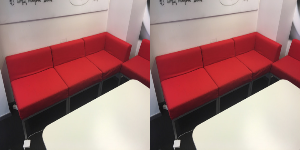

[INFO] hash: 9d619eb14e1a326d <module 'imutils.paths' from '/usr/local/lib/python3.7/dist-packages/imutils/paths.py'>


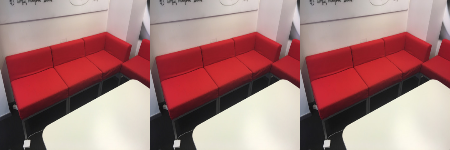

[INFO] hash: 9d619eb1cf1a3226 <module 'imutils.paths' from '/usr/local/lib/python3.7/dist-packages/imutils/paths.py'>


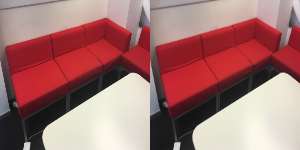

[INFO] hash: ea95856a1fc16a3c <module 'imutils.paths' from '/usr/local/lib/python3.7/dist-packages/imutils/paths.py'>


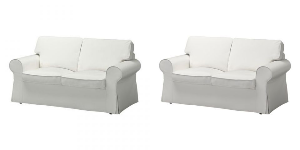

In [42]:
hashes = compute_hashes(path_to_images, dhash)
show_duplicates(hashes)

### Comment
As expected only very simimar images are identified with this method. This method can be useull to make a first filter in a base with lots of images to detect the litteral duplicates.

### different hash methods

let's test different precomputed hash methods from imagehash library

In [32]:
!pip install imagehash


In [33]:
import imagehash

In [34]:
path_to_images="/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/"

[INFO] computing image hashes...
[INFO] hash: 9d619eb14e1a326d <module 'imutils.paths' from '/usr/local/lib/python3.7/dist-packages/imutils/paths.py'>


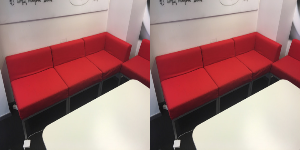

[INFO] hash: 9d619eb14e1a326d <module 'imutils.paths' from '/usr/local/lib/python3.7/dist-packages/imutils/paths.py'>


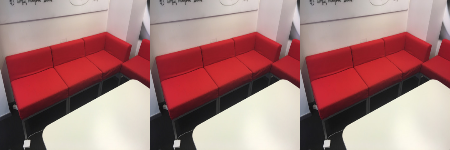

[INFO] hash: 9d619eb1cf1a3226 <module 'imutils.paths' from '/usr/local/lib/python3.7/dist-packages/imutils/paths.py'>


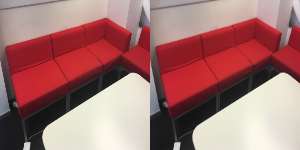

[INFO] hash: ea95856a1fc16a3c <module 'imutils.paths' from '/usr/local/lib/python3.7/dist-packages/imutils/paths.py'>


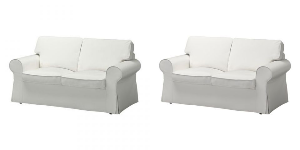

In [43]:
hashes = compute_hashes(path_to_images, imagehash.phash)
show_duplicates(hashes)

### Comment
There is an improvement over a simple distant measure. However, it is still limited. It can be used as a rough filter. What is quite interpelling is that all the red sofa images are not put together. There must be some pixels modifications done to the images.

# Image embedding

This approach aimes to create a mathematical representation of an image so that two images can be compared as dense mathematical vectors. 

The quickest way, it is using pretrained neural network and use one of its layers to create embedding. This trick is called transfer learning. 

Here I will use *resnet18* which is a network of 18 layers proposed in [Deep Residual Learning for Image Recognition](https://arxiv.org/abs/1512.03385) trained on image net.

I will use 'averagepool' layer which is penultime layer, the one before softmax. Earlier layers can be tested as well even though the averagepool seems to be the most used.

Fine tuning on our data would be ideal to adapt the network to the train data.

inspired by:https://becominghuman.ai/extract-a-feature-vector-for-any-image-with-pytorch-9717561d1d4c

## Compare two images

In [2]:
import torch
import torch.nn as nn
import torchvision.models as models
import torchvision.transforms as transforms
from torch.autograd import Variable
import PIL
from imutils import paths
from IPython.display import display, Image
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

In [2]:
path_to_images="/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/"

In [3]:
# take two images that are very similar but havibg different hash
pic_one = "/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg"
pic_two = "/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg"

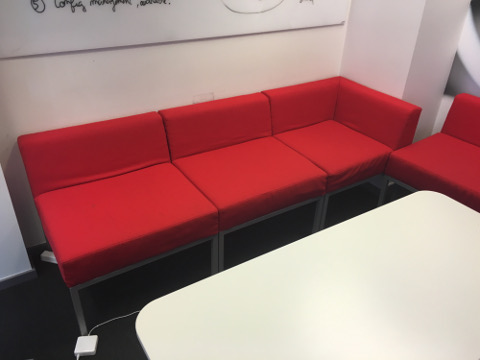

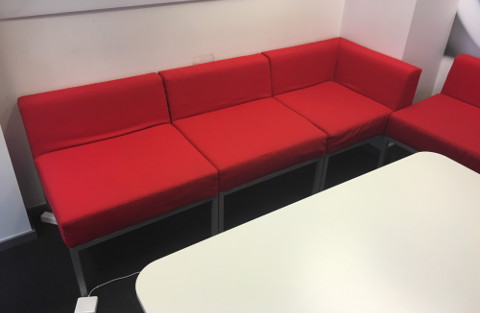

In [4]:
display(Image(filename=pic_one))
display(Image(filename=pic_two))

In [5]:
# take two different images
pic_three = "/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg"
pic_four = "/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1490708845.jpg"

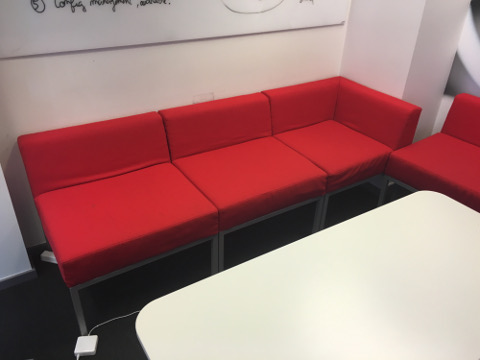

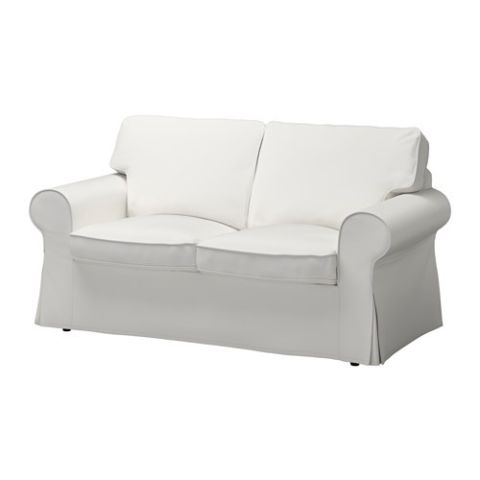

In [6]:
display(Image(filename=pic_three))
display(Image(filename=pic_four))

In [7]:
# Load the resnet pretrained
model = models.resnet18(pretrained=True)
# Select the desired layer
layer = model._modules.get('avgpool')

In [8]:
# Set model to evaluation mode
model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

In [9]:
# Apply tranformation to the image
scaler = transforms.Scale((224, 224))
normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
to_tensor = transforms.ToTensor()

/usr/local/lib/python3.7/dist-packages/torchvision/transforms/transforms.py:317: UserWarning: The use of the transforms.Scale transform is deprecated, please use transforms.Resize instead.
  warnings.warn("The use of the transforms.Scale transform is deprecated, " +


In [10]:
def get_vector(image_name):
    # 1. Load the image with Pillow library
    img = PIL.Image.open(image_name)
    # 2. Create a PyTorch Variable with the transformed image
    t_img = Variable(normalize(to_tensor(scaler(img))).unsqueeze(0))
    # 3. Create a vector of zeros that will hold our feature vector
    #    The 'avgpool' layer has an output size of 512
    my_embedding = torch.zeros(224,512,1,1)
    # 4. Define a function that will copy the output of a layer
    def copy_data(m, i, o):
      my_embedding.copy_(o.data)
    # 5. Attach that function to our selected layer
    h = layer.register_forward_hook(copy_data)
    # 6. Run the model on our transformed image
    model(t_img)
    # 7. Detach our copy function from the layer
    h.remove()
    # 8. Return the feature vector
    return my_embedding

In [11]:
# Using PyTorch Cosine Similarity
def get_similarity(pic1, pic2):
  """obtain consine similarity between two pictures"""
  pic_one_vector = get_vector(pic1)
  pic_two_vector = get_vector(pic2)
  cos = nn.CosineSimilarity(dim=1, eps=1e-6)
  cos_sim = cos(pic_one_vector.reshape((1, -1)),
                pic_two_vector.reshape((1, -1)))[0]
  print('\nCosine similarity: {0}\n'.format(cos_sim))

In [12]:
get_similarity(pic_one, pic_two)


Cosine similarity: 0.9617531895637512



In [13]:
get_similarity(pic_three, pic_four)


Cosine similarity: 0.7418389320373535



### Comment
The two similar images get high similarity score. However the score of two different sofas is not as low as expected.

The challenge here is to define what is a duplicate and what would be the similarity threshold defining it.

## Calculating parwise distance between image embeddings

One idea to define simiarity threshold is to see the overall distribution of the parwise scores on representative data sample. 

Our data sample is small therfore I can use all of it. I can also use the sampel without duplicated to define "background" similarity.

In [14]:
path_to_images_dup="/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/"
path_to_images_nondup="/content/drive/MyDrive/Advenita-assignment/Non-duplicate-ads/"

In [15]:
imagePathsDup = list(paths.list_images(path_to_images_dup))
imagePathsNondup = list(paths.list_images(path_to_images_nondup))


In [16]:

def images_to_embeddings(imagePaths):
	"""computes matrix of parwise cosine similarity"""
	print(f"[INFO] computing image embeddings of {len(imagePaths)} images...")
	E = torch.empty(len(imagePaths),114688)
	# loop over our image paths
	for i, imagePath in enumerate(imagePaths):
		# load the input image and compute the hash
		v1 = get_vector(imagePath)
		E[i] = v1.reshape((1, -1))
	return E

# vectorisation would seed up the preocess

In [17]:
dup_emb = images_to_embeddings(imagePathsDup)
nondup_emb = images_to_embeddings(imagePathsNondup)

[INFO] computing image embeddings of 110 images...
[INFO] computing image embeddings of 5 images...


In [18]:
def embeddings_to_cosine_similarity_matrix(E):
  """ 
  Converts a a tensor of n embeddings to an (n, n) tensor of similarities.
  """
  cos = nn.CosineSimilarity(dim=1, eps=1e-6)
  similarities = [[cos(a.reshape((1, -1)), b.reshape((1, -1))) for a in E] for b in E]
  similarities = list(map(torch.cat, similarities))
  return torch.stack(similarities)

cosine_dist_dup = embeddings_to_cosine_similarity_matrix(dup_emb)
cosine_dist_nondup = embeddings_to_cosine_similarity_matrix(nondup_emb)

In [19]:
def cosine_similarity_matrix_flatten(cosine_dist_matrix):
  return (pd.DataFrame(cosine_dist_matrix.numpy()).where(np.triu(np.ones(pd.DataFrame(cosine_dist_matrix.numpy()).shape), k=1).astype(bool))
                    .stack()
                    .sort_values(ascending=False))


In [20]:
cosine_dist_dup_flat = cosine_similarity_matrix_flatten(cosine_dist_dup)
cosine_dist_nondup_flat = cosine_similarity_matrix_flatten(cosine_dist_nondup)

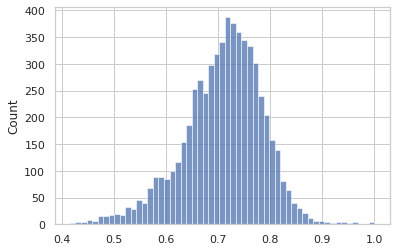

In [21]:
sns.set(style="whitegrid")
sns.histplot(data=cosine_dist_dup_flat)
plt.show()

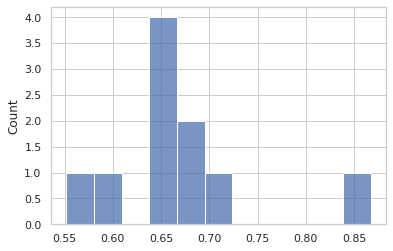

In [22]:
sns.histplot(data=cosine_dist_nondup_flat)
plt.show()

### Comment

We can see that the similarity of no duplicated images can be as high as 0.85. 

As sample is small, let's see all the similar pairs in the data with duplication above this threshold.

In [23]:
above_threshold = cosine_dist_dup_flat[cosine_dist_dup_flat>0.85]

1.0
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


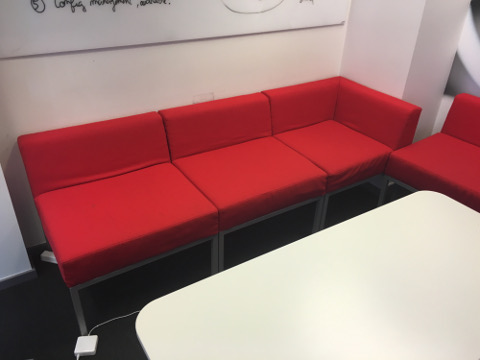

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


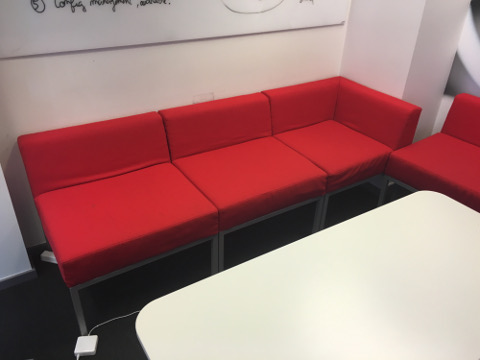

0.99963444
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


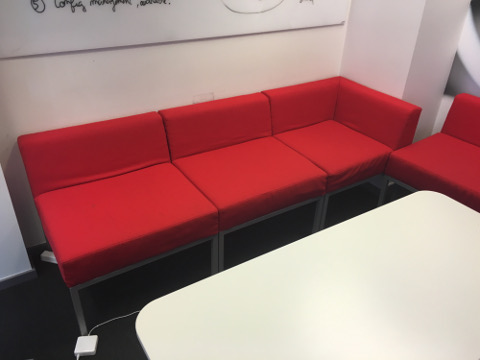

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


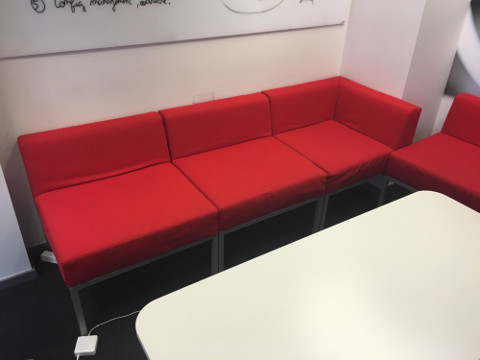

0.99963444
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


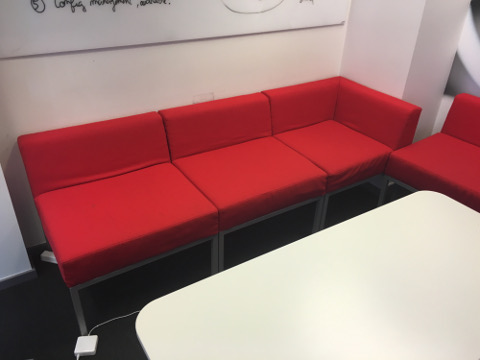

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


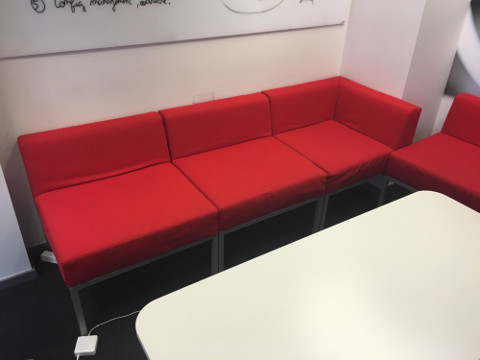

0.9980423
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/60_2091951686.jpg


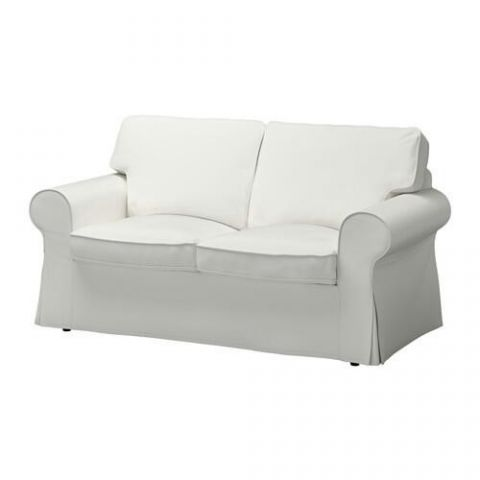

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1490708845.jpg


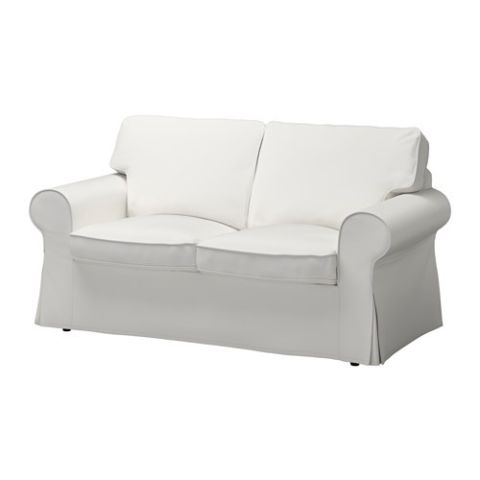

0.9913467
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg


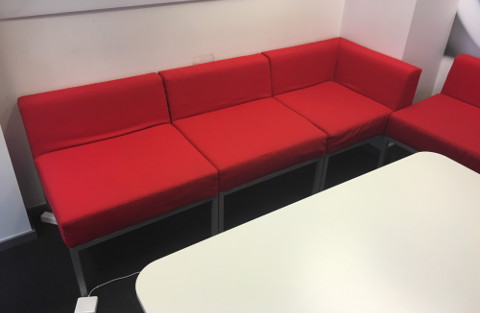

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/17_828296168.jpg


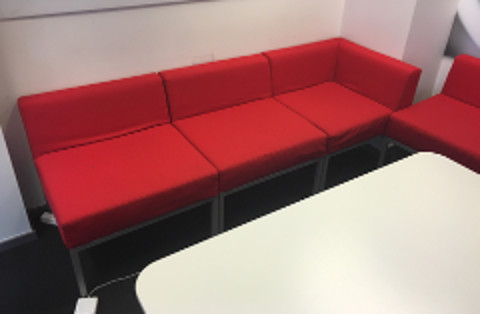

0.9619722
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


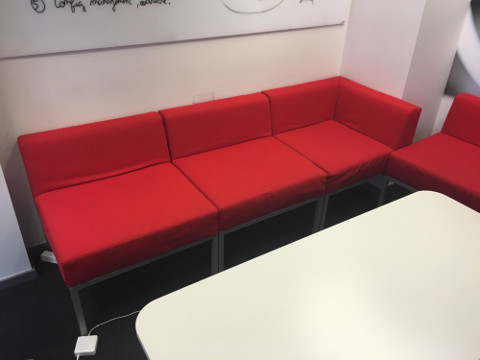

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg


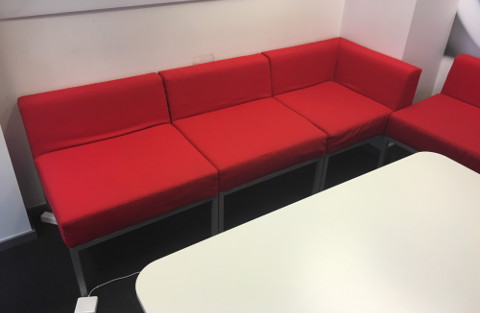

0.9617532
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


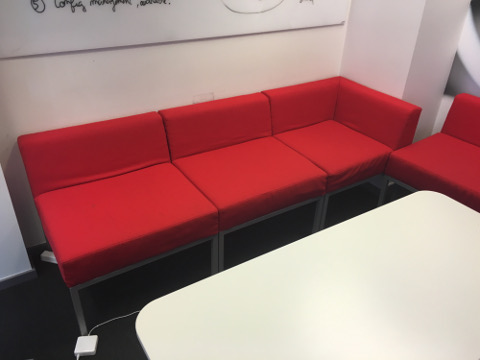

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg


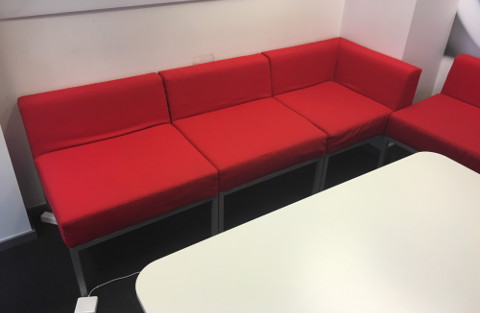

0.9617532
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


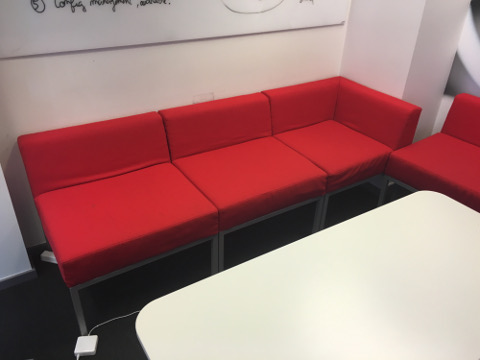

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg


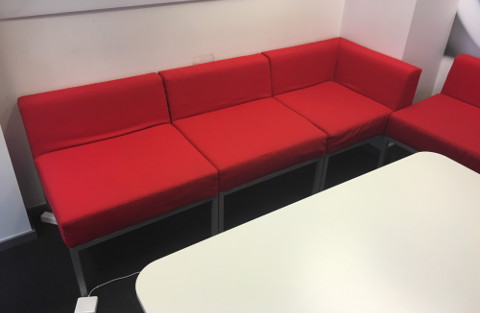

0.9575954
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


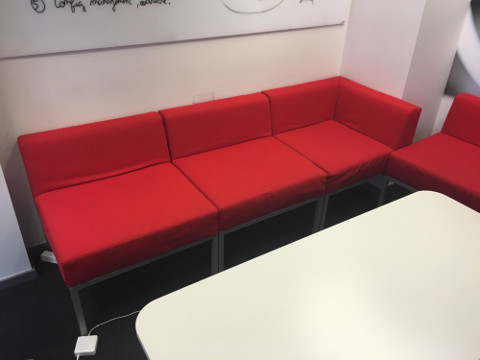

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/17_828296168.jpg


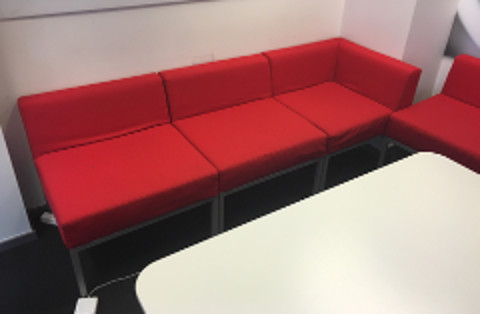

0.95740527
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


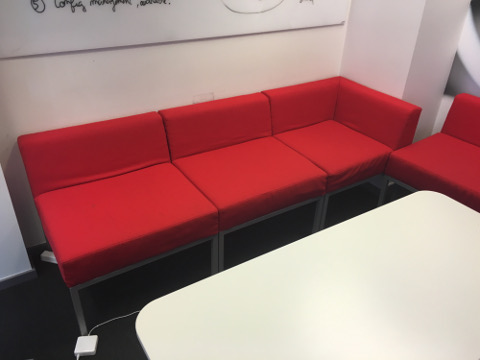

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/17_828296168.jpg


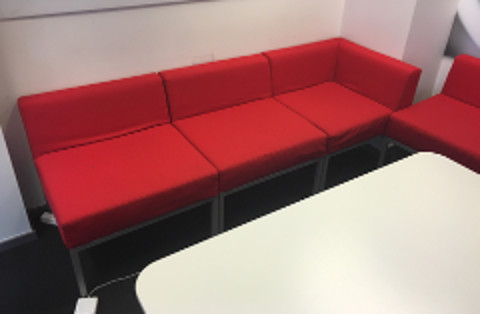

0.95740527
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


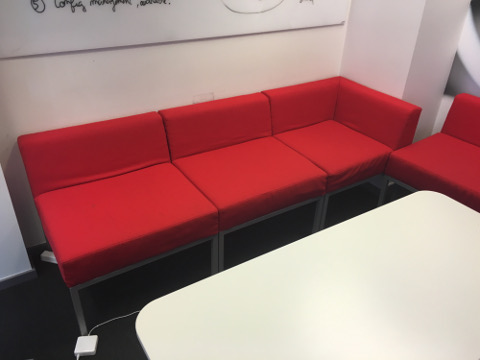

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/17_828296168.jpg


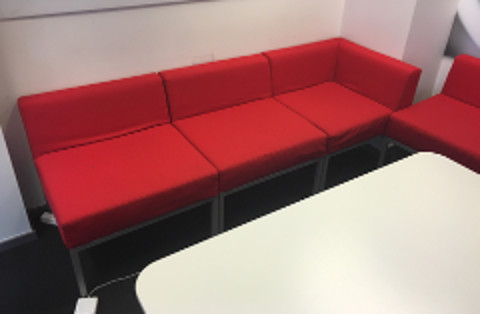

0.9426687
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


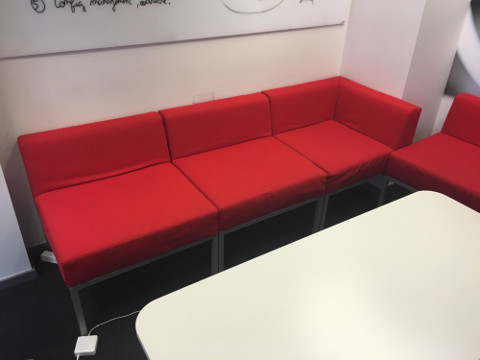

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/88_7139005155.jpg


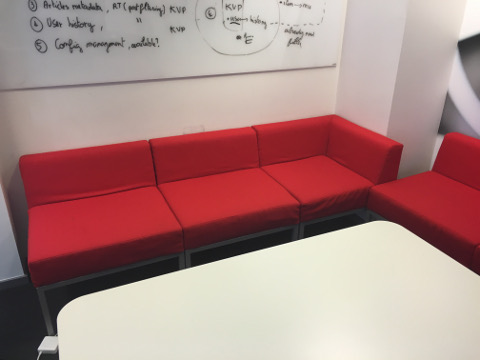

0.94238955
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


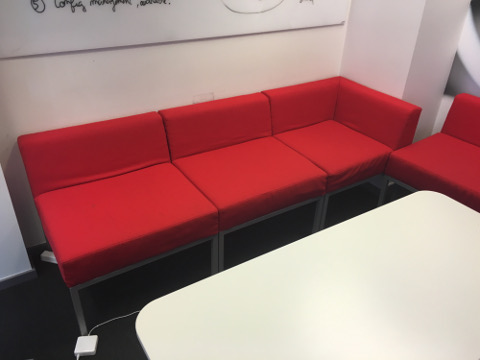

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/88_7139005155.jpg


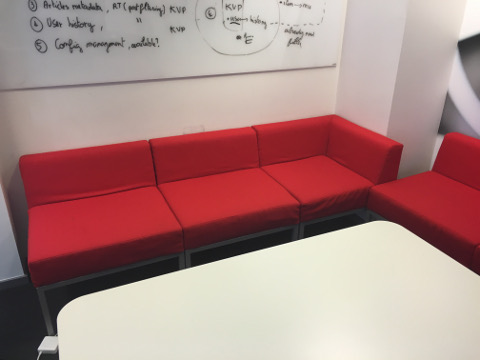

0.94238955
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


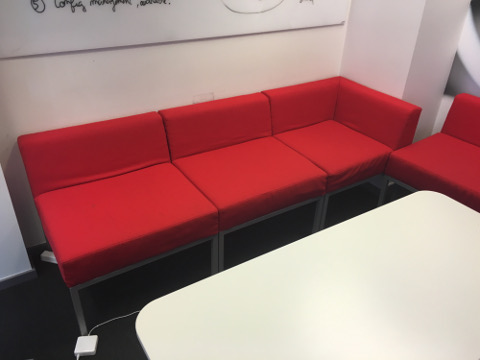

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/88_7139005155.jpg


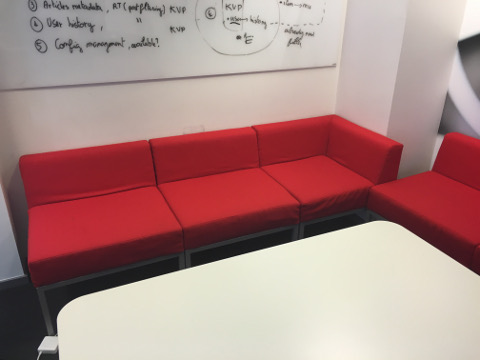

0.9415388
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/66_642824605.jpg


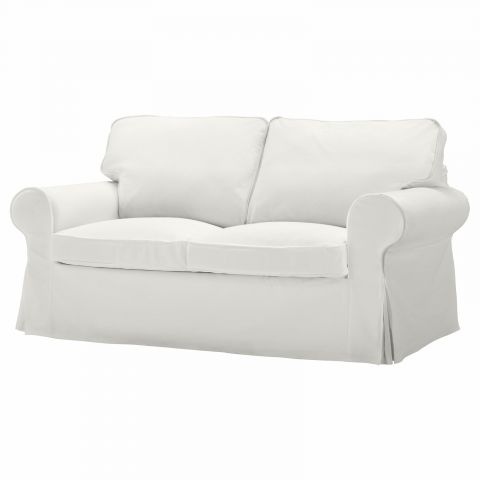

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


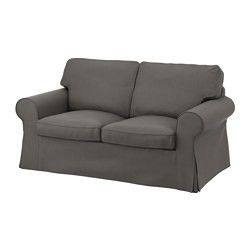

0.9399305
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/66_642824605.jpg


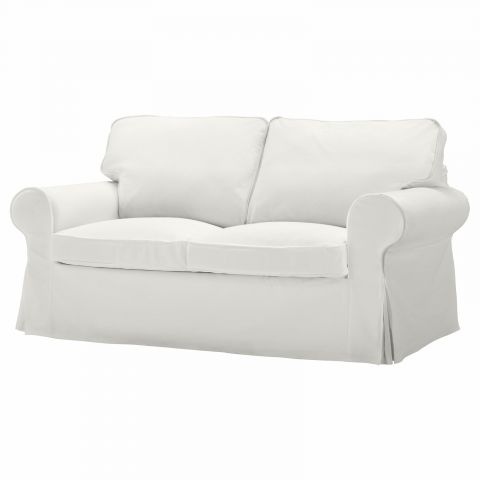

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/60_2091951686.jpg


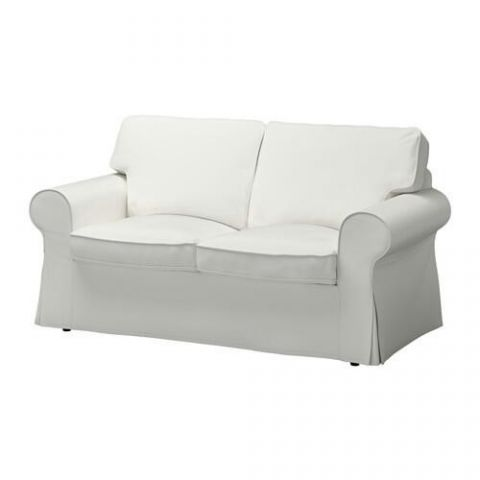

0.93469447
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/66_642824605.jpg


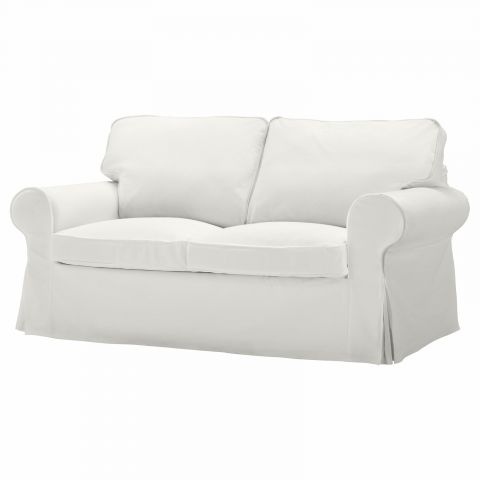

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1490708845.jpg


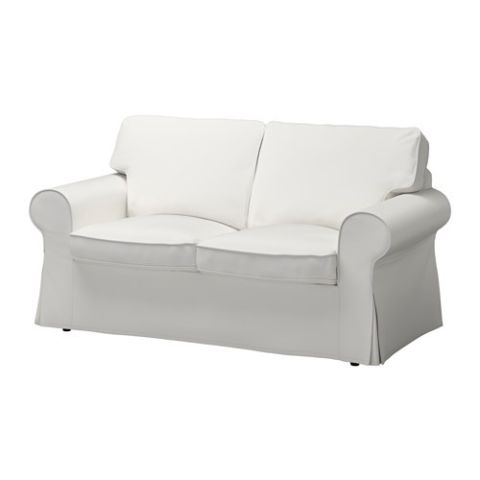

0.93183583
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


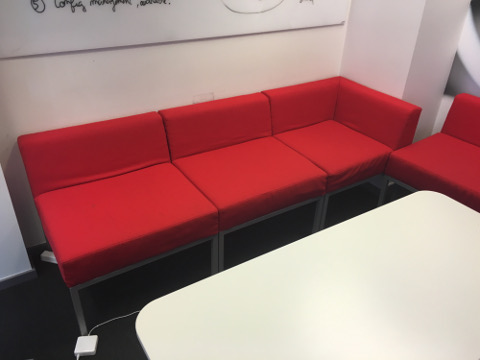

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_758351074.jpg


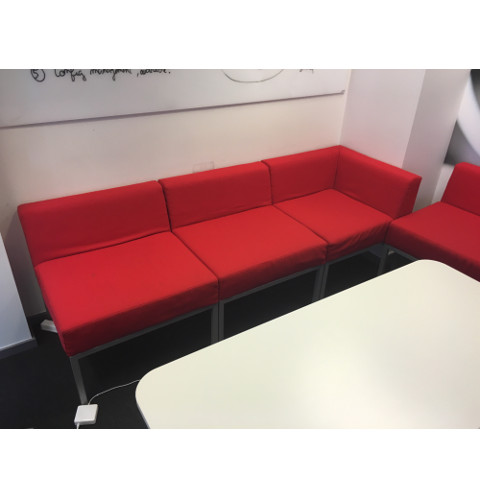

0.93183583
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


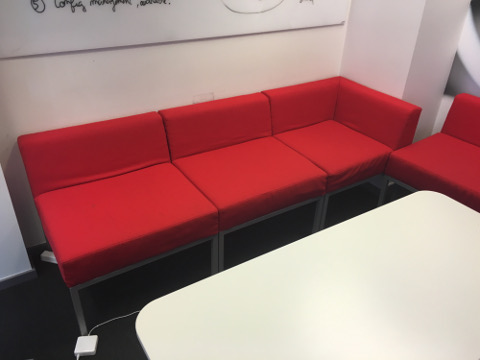

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_758351074.jpg


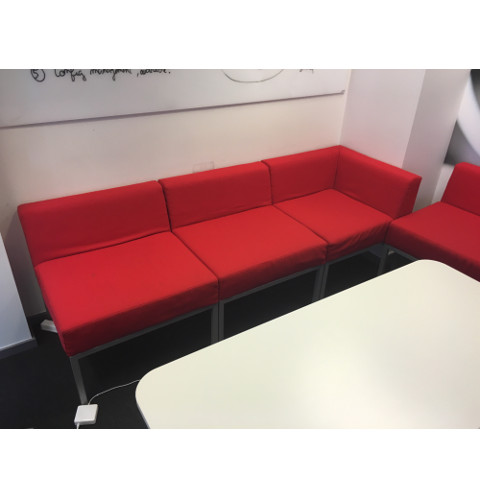

0.92942166
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


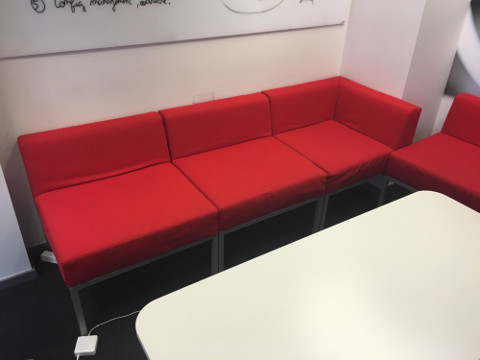

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_758351074.jpg


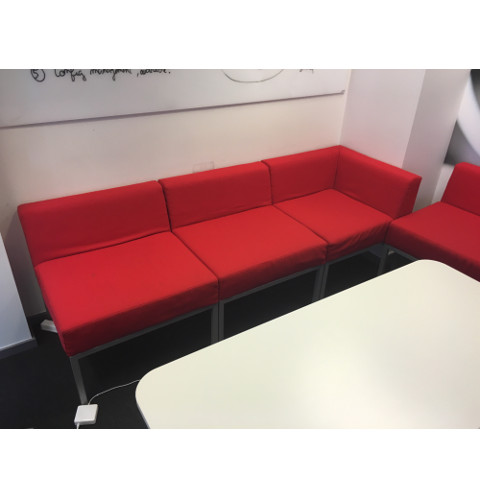

0.92531246
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_758351074.jpg


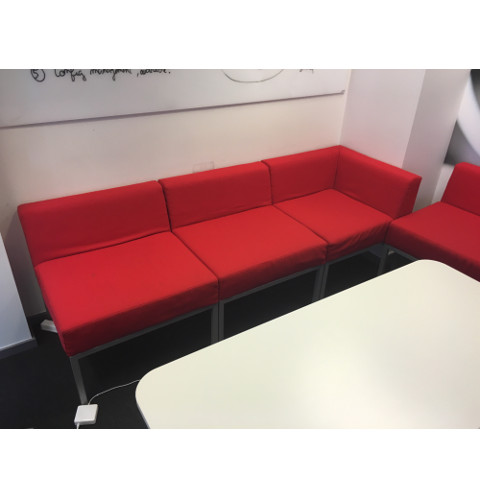

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg


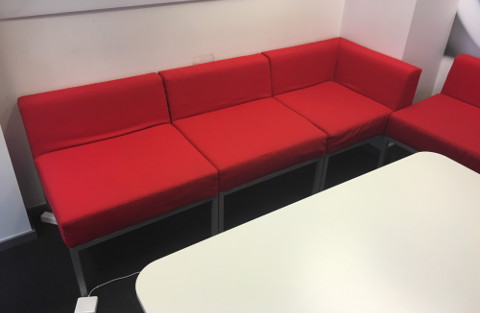

0.91880333
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_758351074.jpg


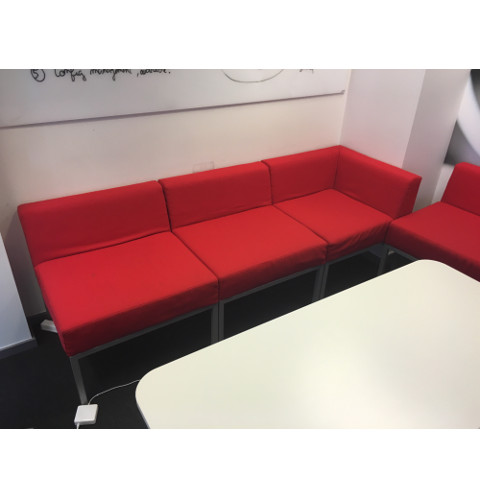

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/17_828296168.jpg


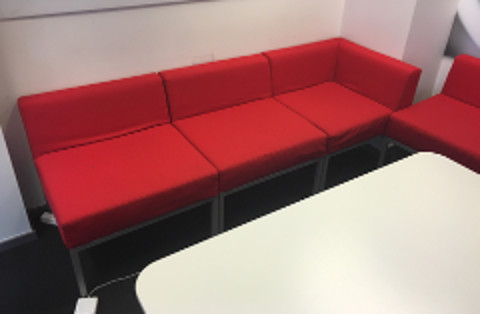

0.91594
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg


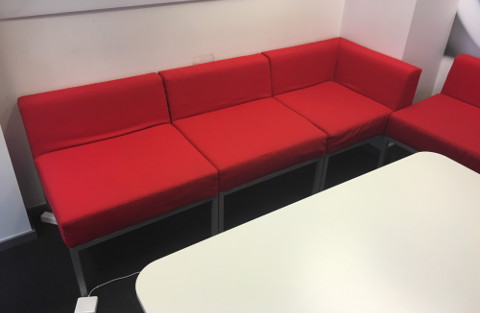

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/88_7139005155.jpg


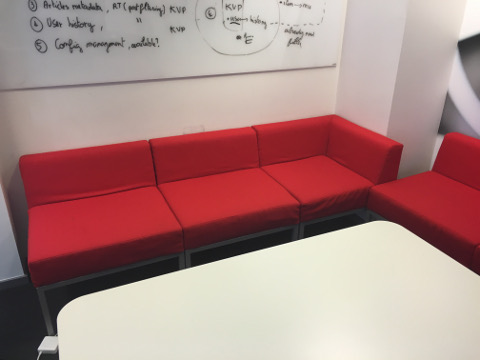

0.91437024
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/17_828296168.jpg


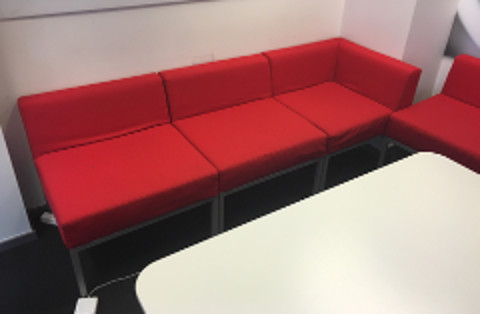

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/88_7139005155.jpg


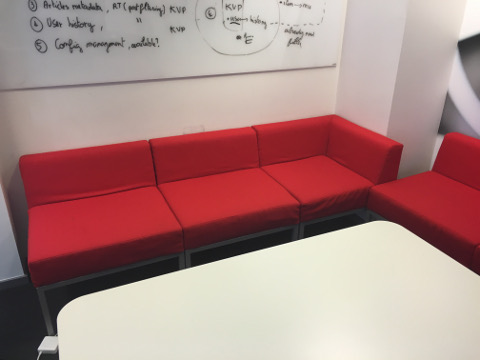

0.91346586
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/60_2091951686.jpg


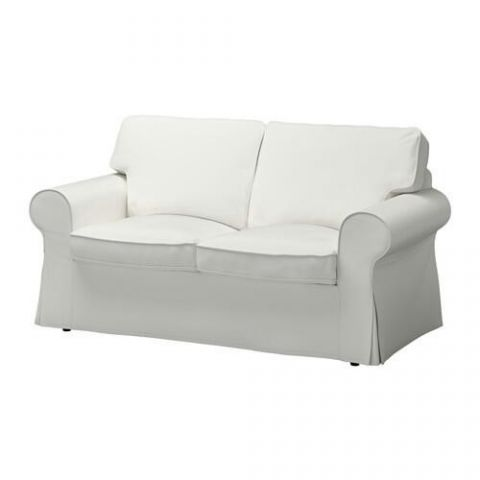

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


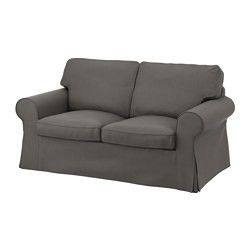

0.90814805
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1490708845.jpg


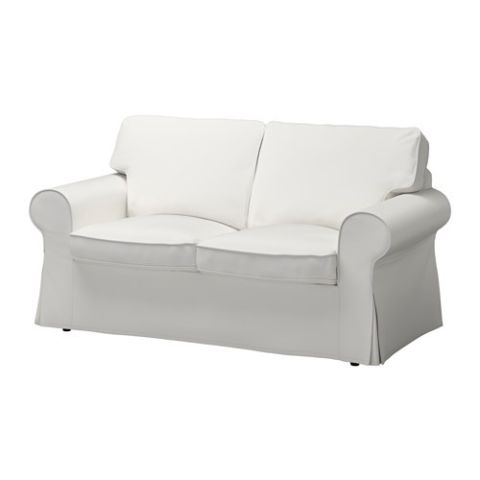

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


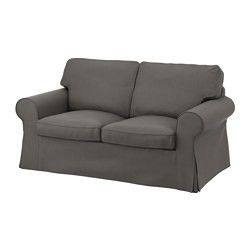

0.90778327
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


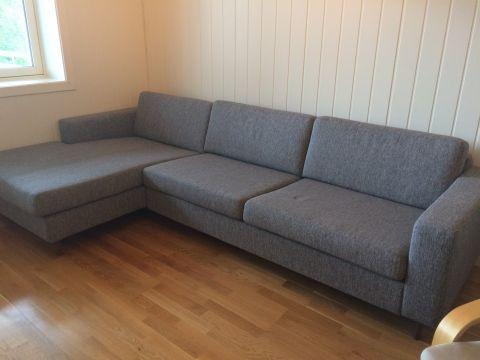

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


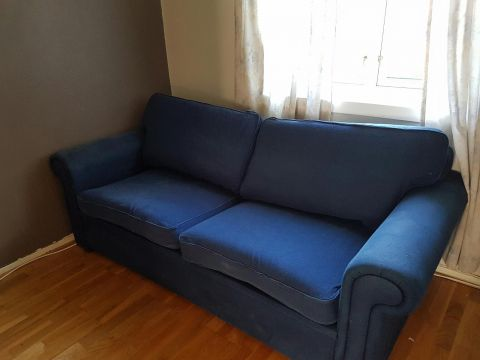

0.9005293
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_758351074.jpg


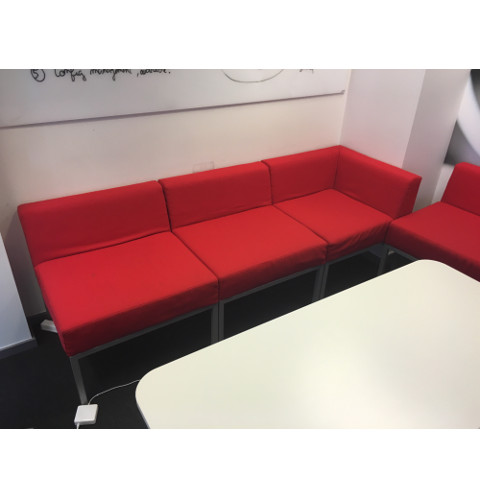

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/88_7139005155.jpg


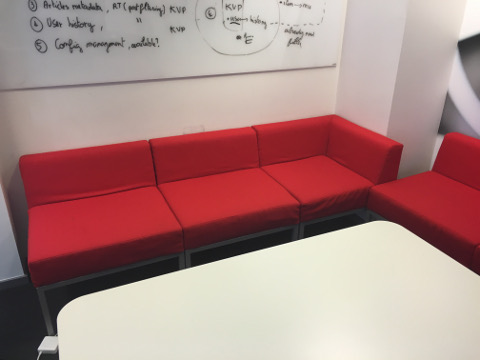

0.8988064
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/29_1742048333.jpg


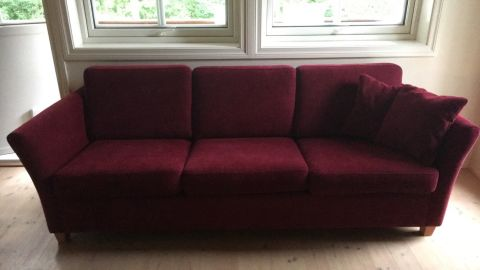

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


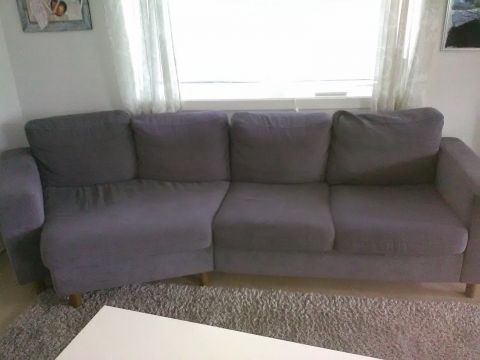

0.8976933
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/72_1016543161.jpg


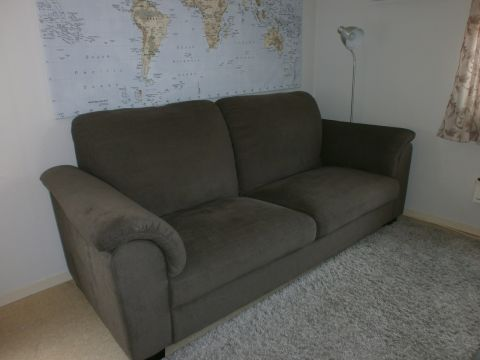

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


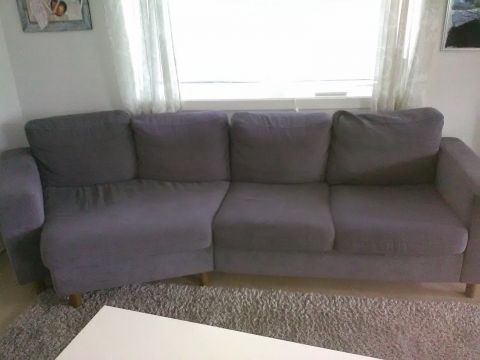

0.8947356
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_787542253.jpg


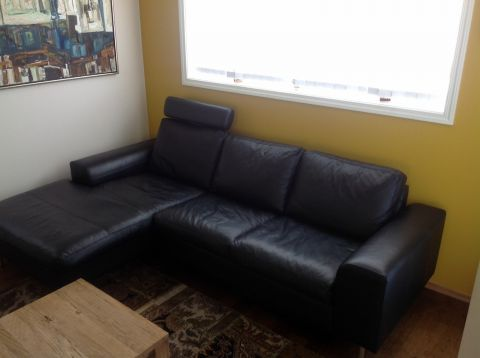

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


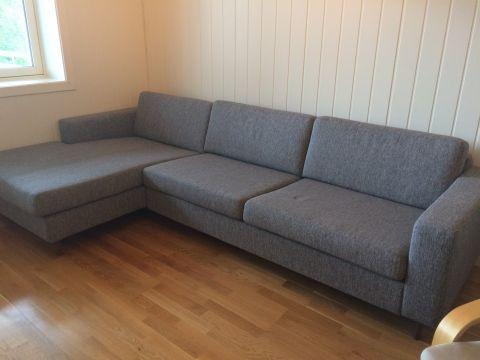

0.89461297
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/59_1918146649.jpg


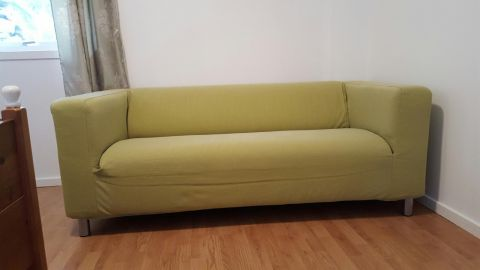

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


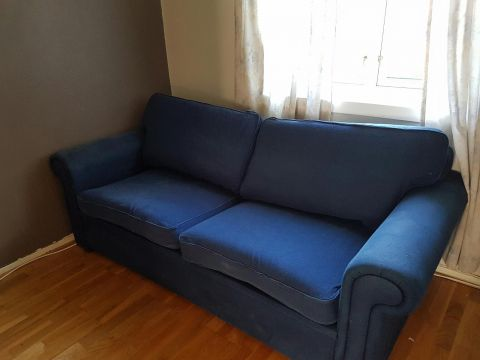

0.8937831
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/59_1918146649.jpg


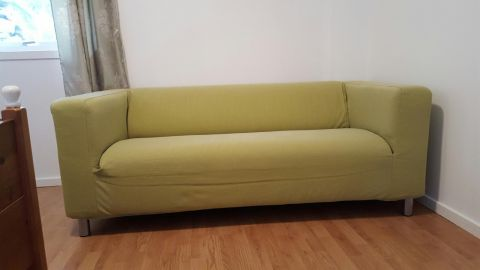

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


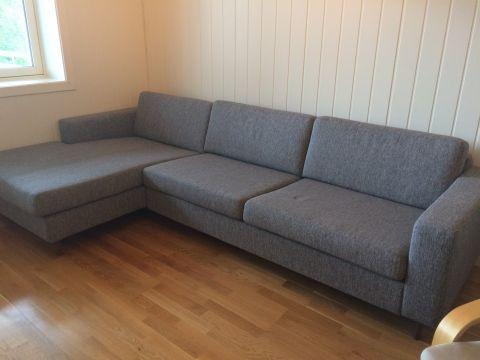

0.8897036
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_787542253.jpg


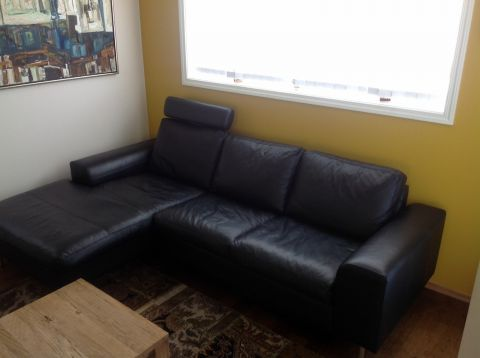

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


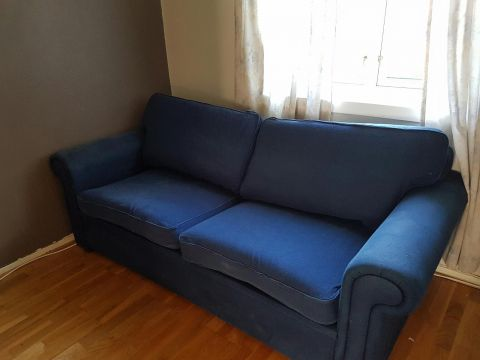

0.8884308
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


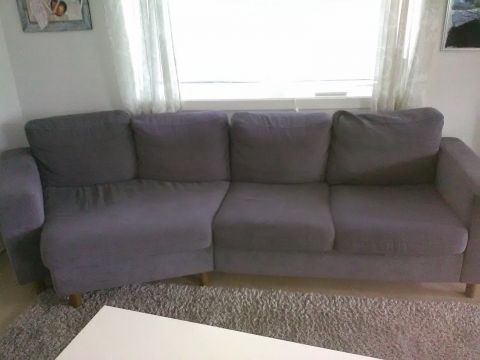

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


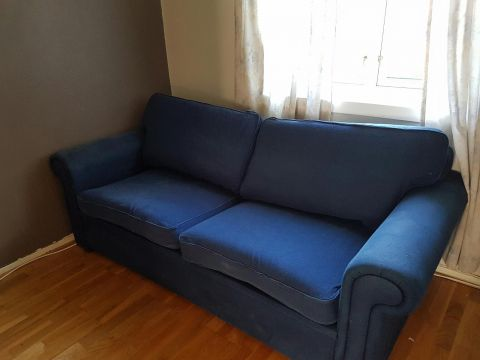

0.8875013
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/27_456436351.jpg


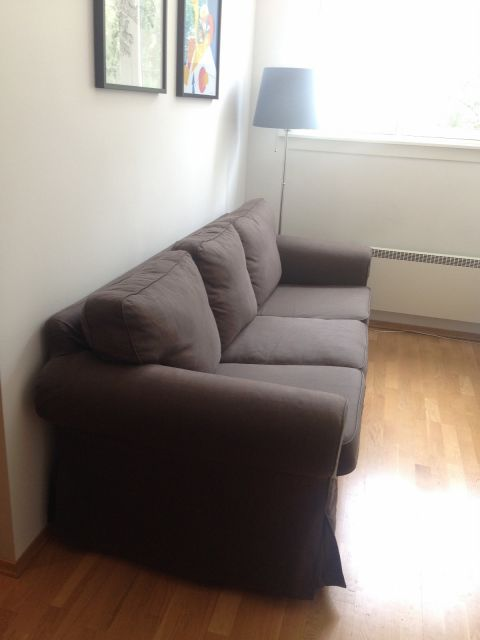

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


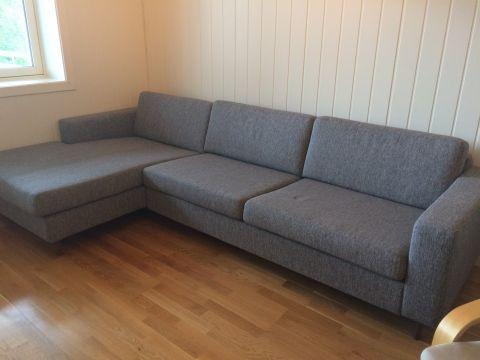

0.88654894
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/49_126067392.jpg


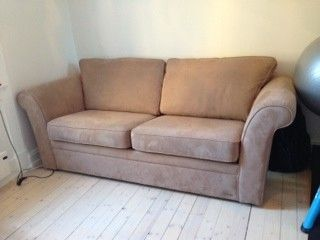

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


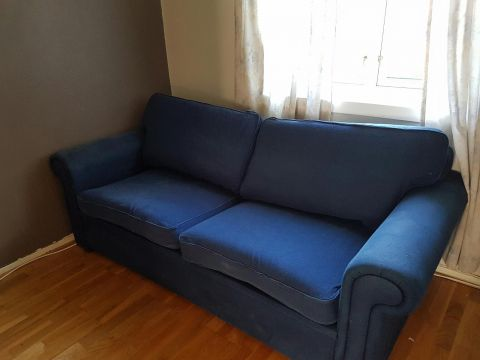

0.8862673
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/72_1016543161.jpg


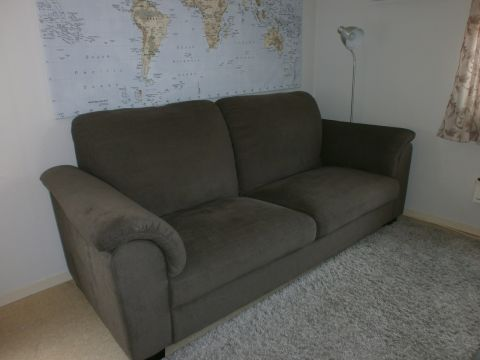

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/49_126067392.jpg


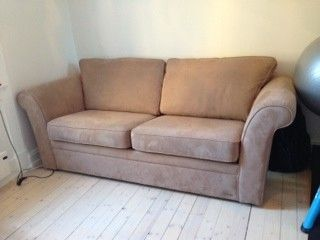

0.88416064
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/49_126067392.jpg


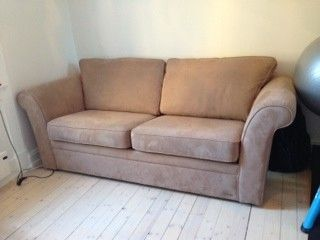

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


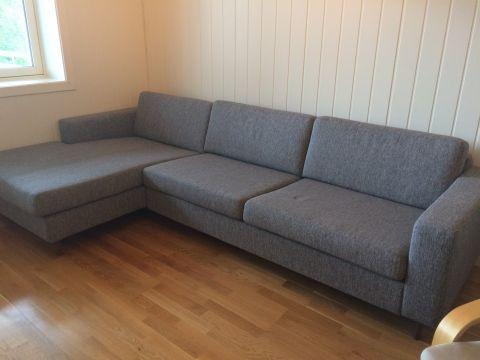

0.88207114
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_469036166.jpg


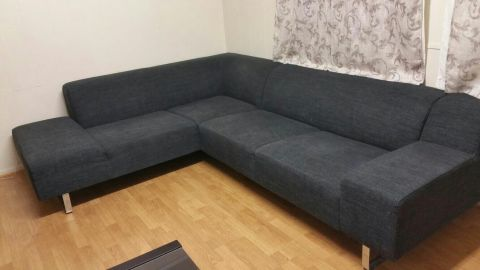

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


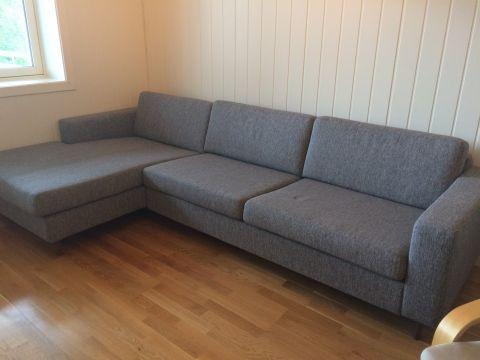

0.88000476
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/72_1016543161.jpg


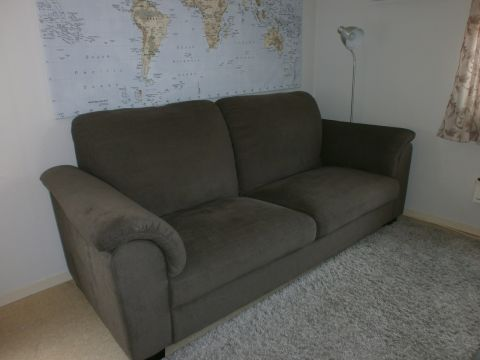

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


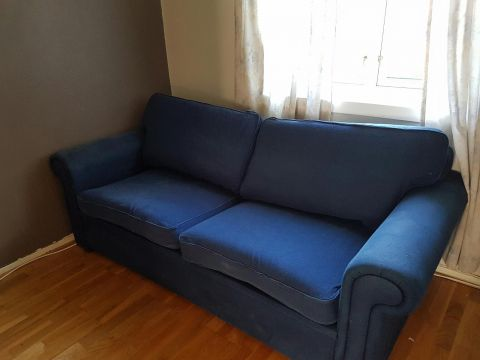

0.8794772
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/65_1302116323.jpg


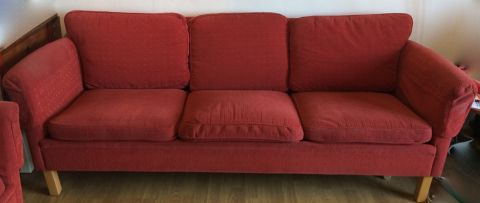

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/61_2109734824.jpg


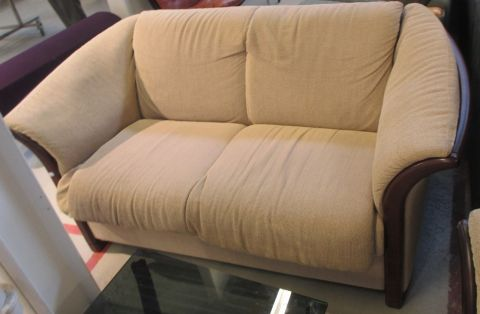

0.87885326
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/27_456436351.jpg


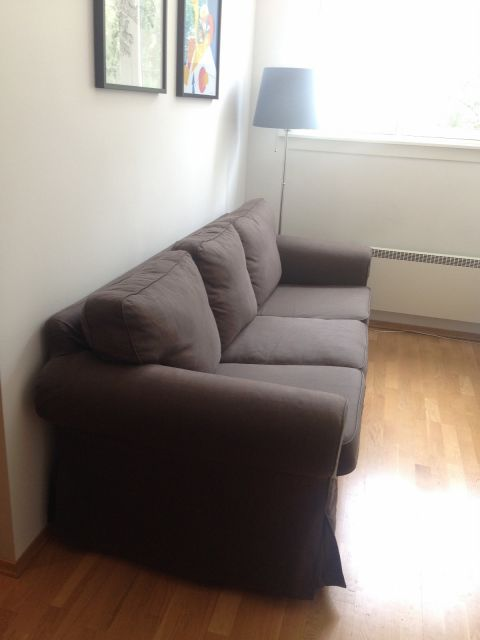

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1594465935.jpg


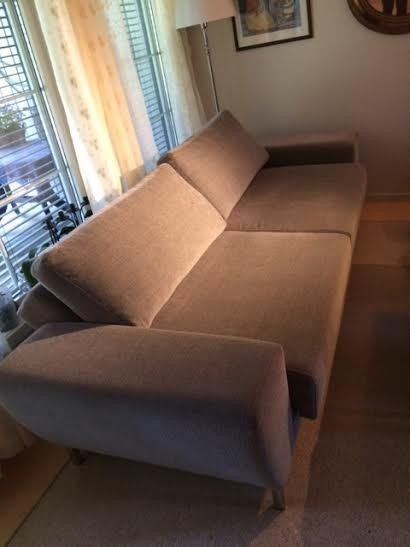

0.87722135
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/59_1918146649.jpg


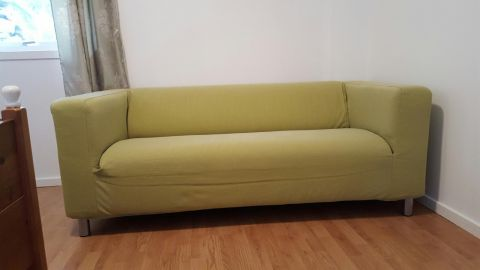

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


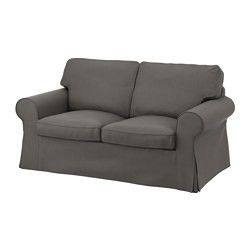

0.87582374
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_787542253.jpg


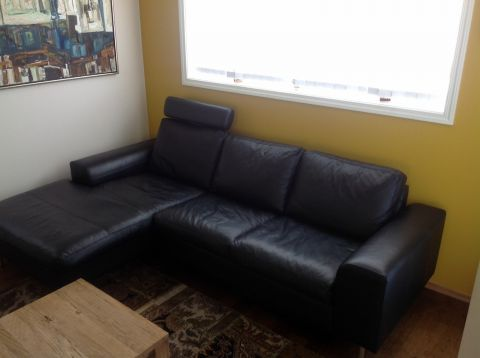

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


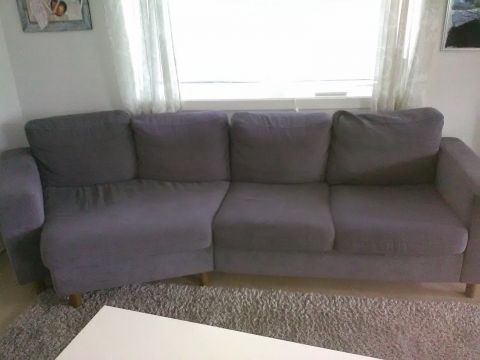

0.8751467
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/65_1302116323.jpg


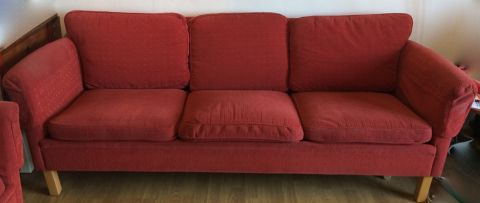

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


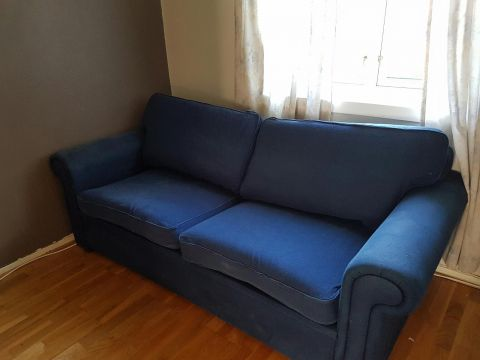

0.8745947
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/70_1395905134.jpg


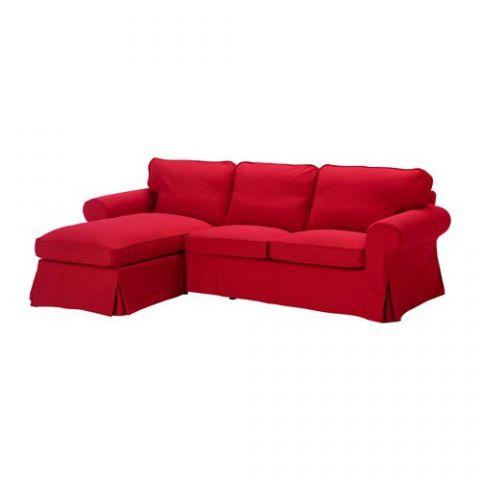

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/80_1470928833.jpg


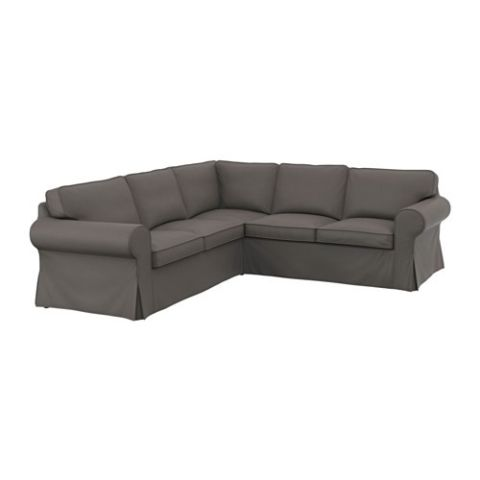

0.8745733
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/72_1016543161.jpg


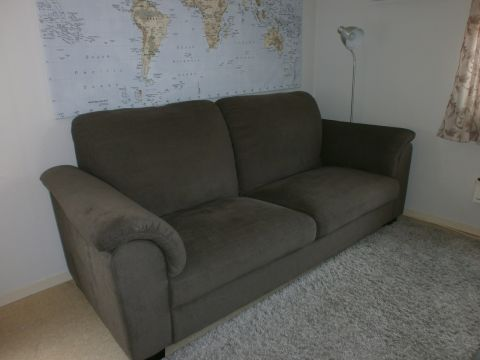

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


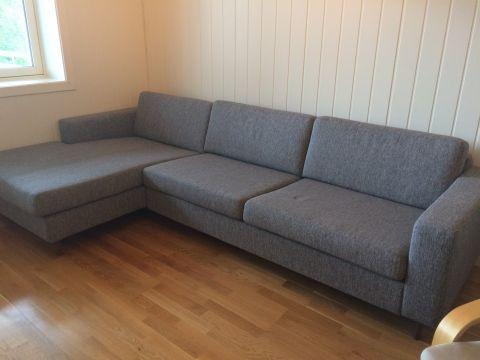

0.87323755
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/93_1957428244.jpg


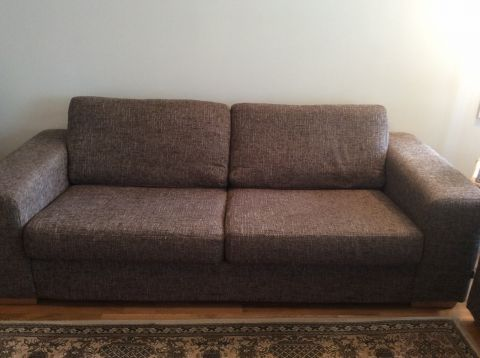

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/53_120969972.jpg


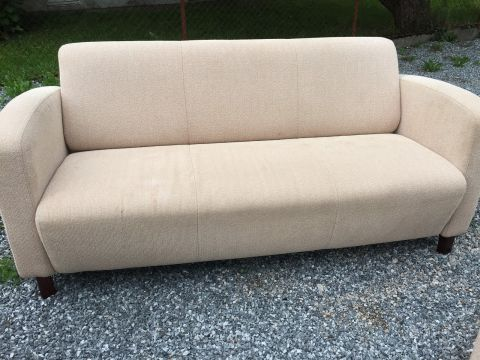

0.87280154
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/28_1669977299.jpg


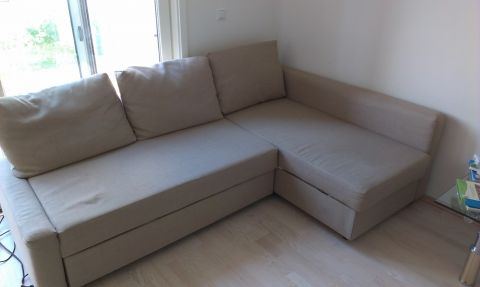

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


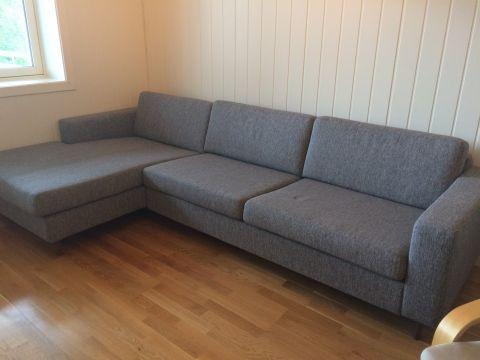

0.8727196
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/20_1002801005.jpg


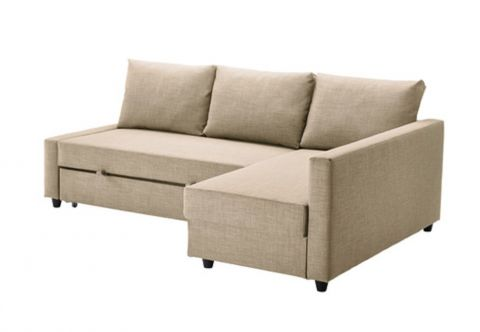

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


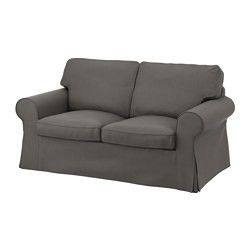

0.8720531
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


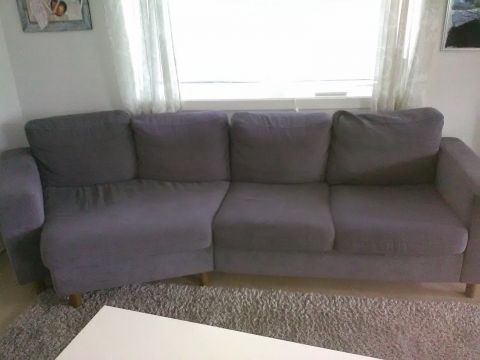

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/84_1283115679.jpg


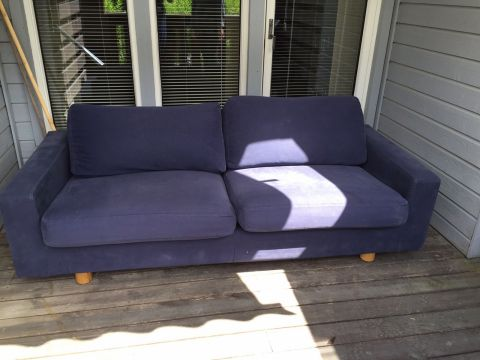

0.87011296
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


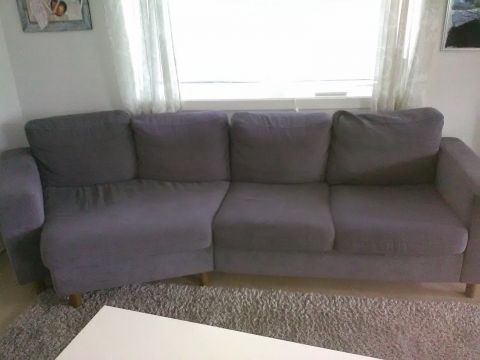

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


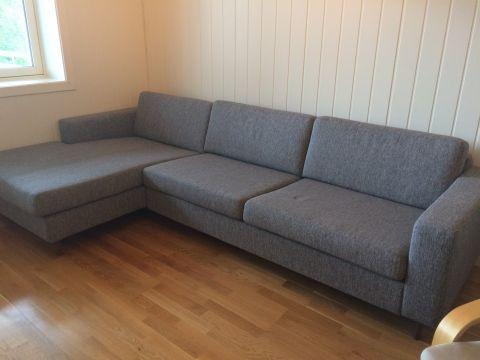

0.8689242
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/59_1918146649.jpg


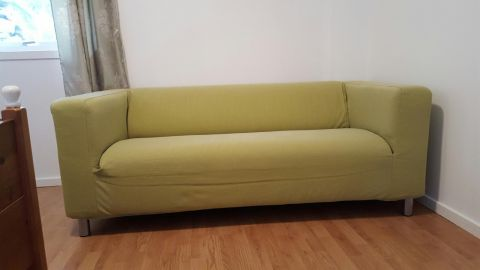

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/49_126067392.jpg


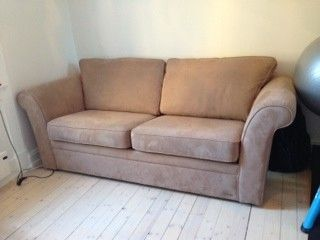

0.8682758
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_96412658.jpg


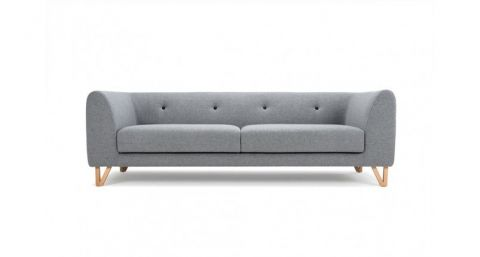

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/69_1510609504.jpg


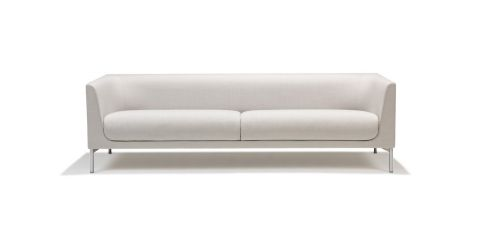

0.86824626
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/70_231993937.jpg


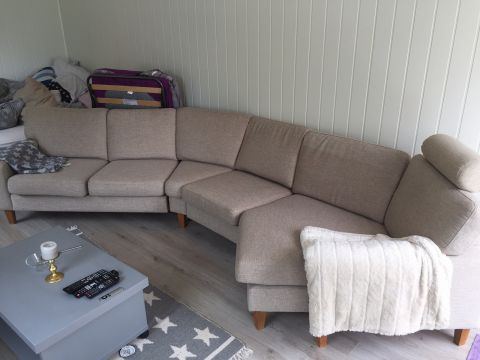

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1594465935.jpg


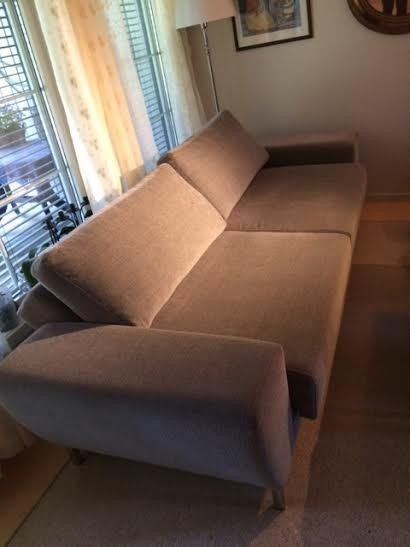

0.86818683
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_787542253.jpg


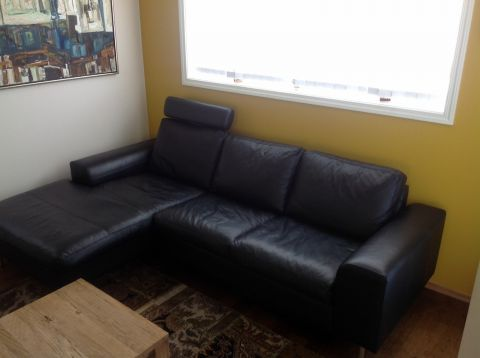

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/27_456436351.jpg


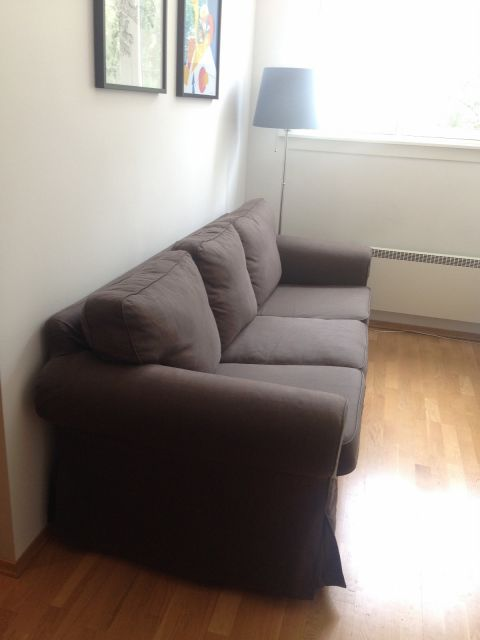

0.86731684
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/65_1302116323.jpg


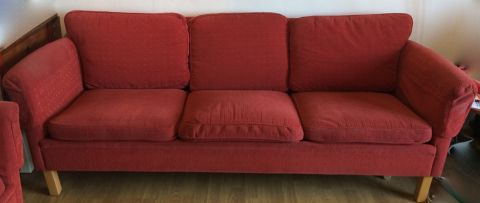

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


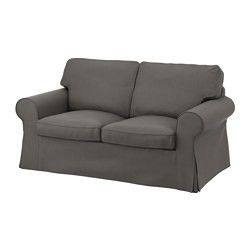

0.86711895
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/59_1918146649.jpg


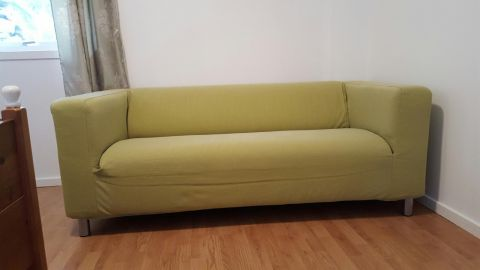

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/27_456436351.jpg


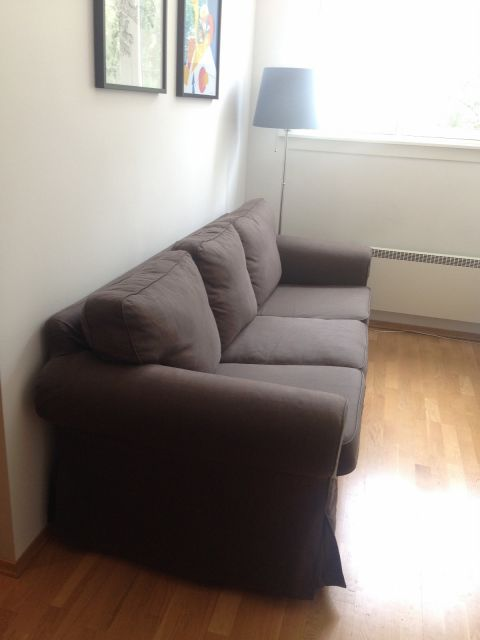

0.86630225
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/93_1957428244.jpg


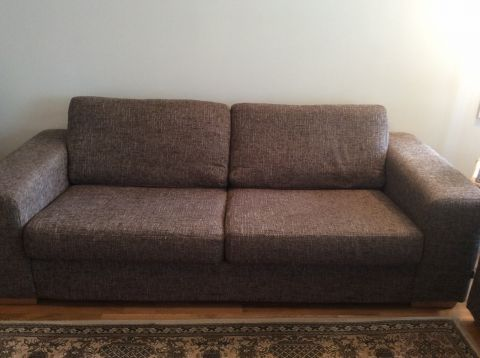

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_469036166.jpg


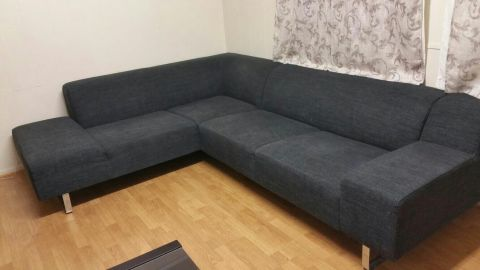

0.86625695
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/27_456436351.jpg


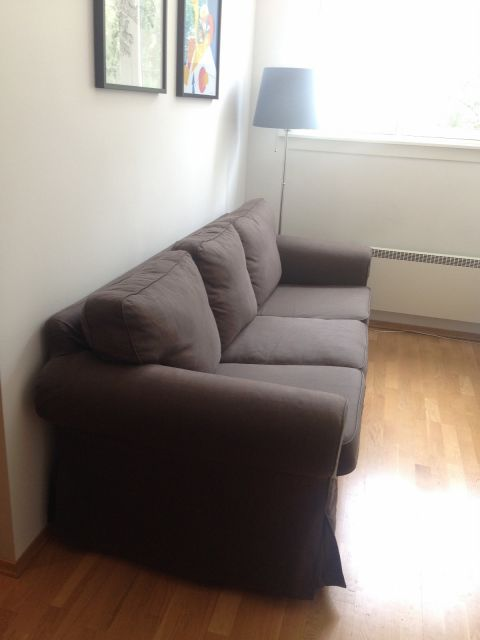

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


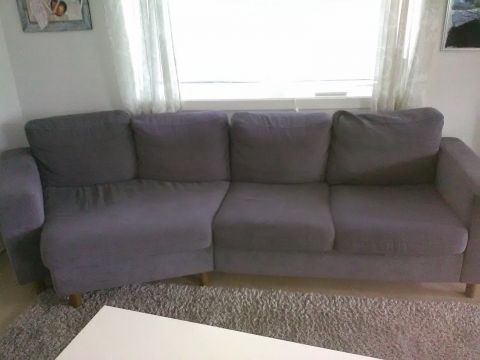

0.86614597
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/70_231993937.jpg


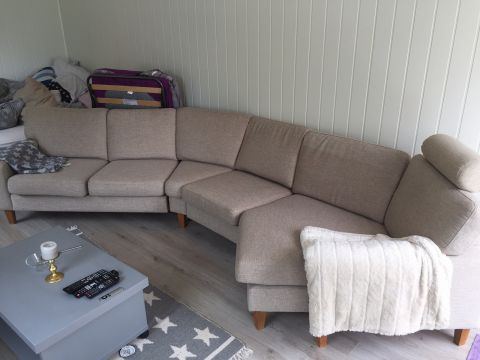

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/07_267065768.jpg


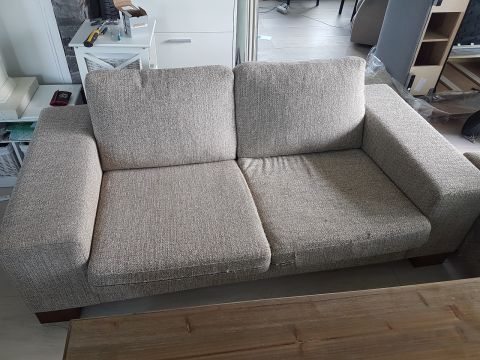

0.8658873
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/84_1283115679.jpg


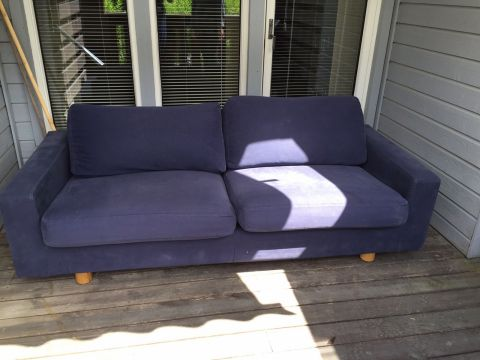

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


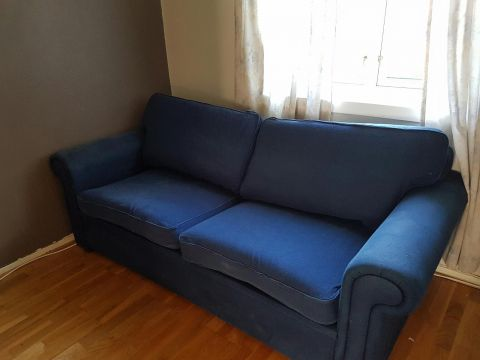

0.86549723
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


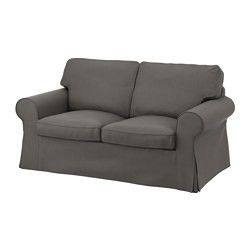

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


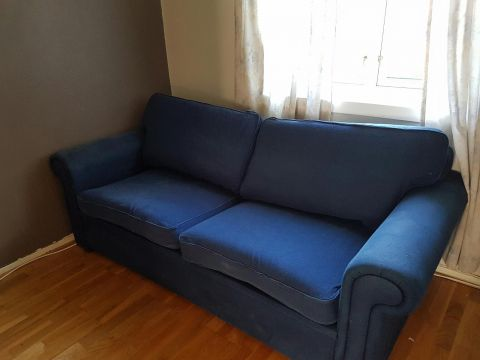

0.86517495
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/39_1183693227.jpg


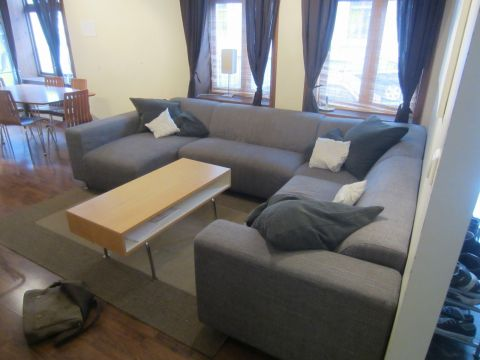

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1045416264.jpg


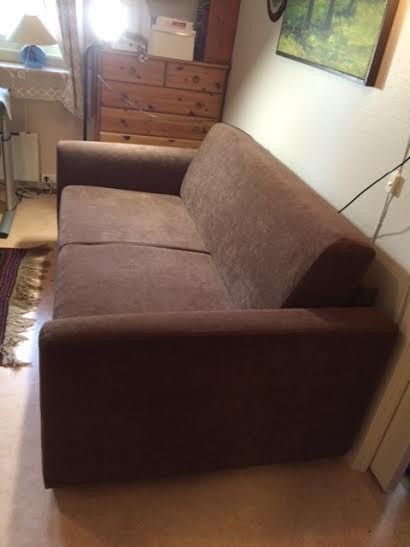

0.8644379
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/59_1918146649.jpg


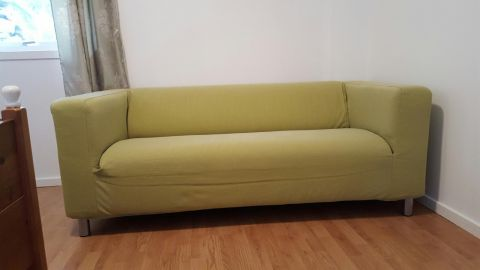

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/66_642824605.jpg


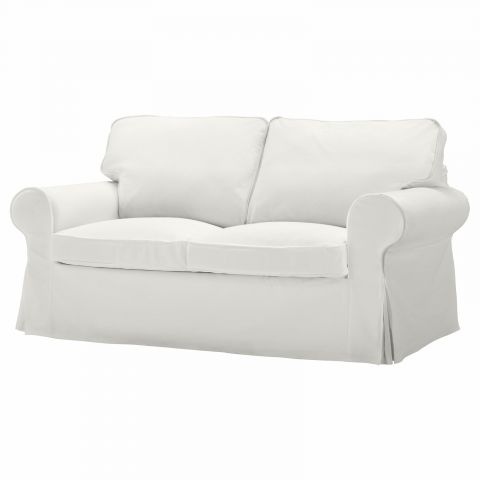

0.86419237
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/91_410753649.jpg


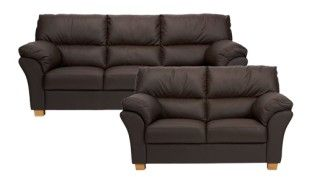

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


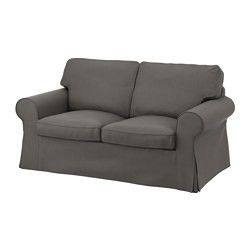

0.8638407
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/29_1742048333.jpg


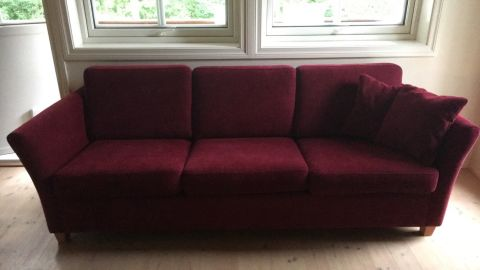

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/65_1302116323.jpg


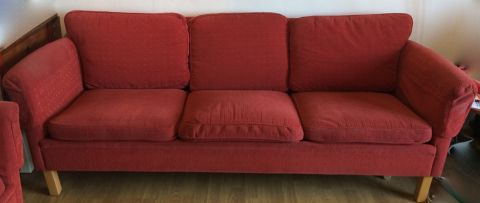

0.8631322
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/34_1962130479.jpg


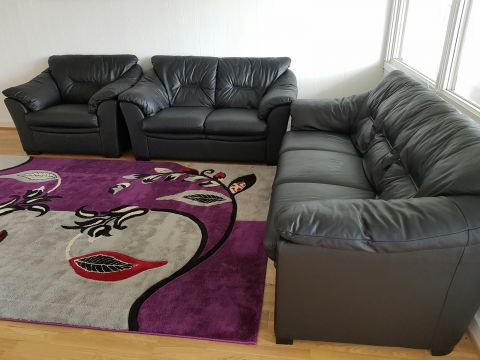

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


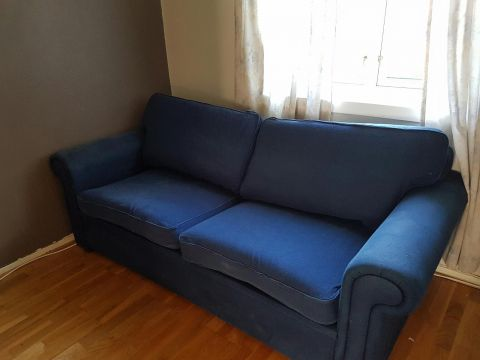

0.8630313
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/24_1599811419.jpg


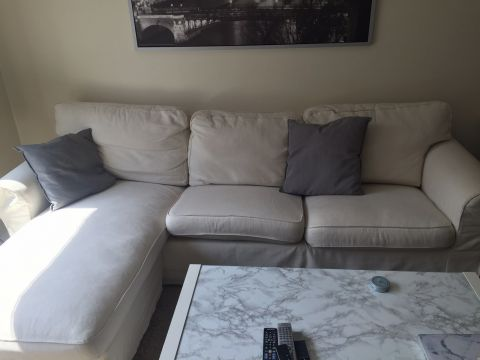

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/70_231993937.jpg


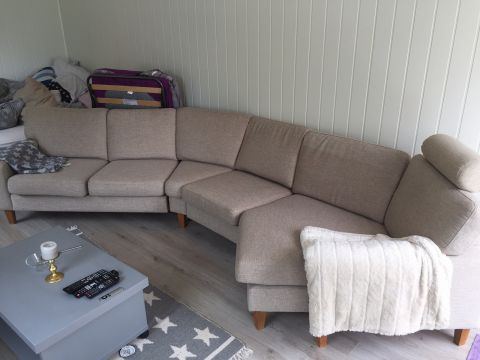

0.86182195
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/93_1957428244.jpg


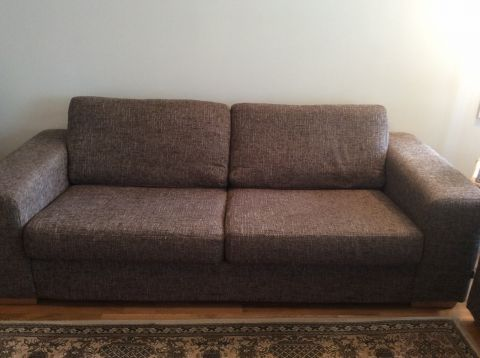

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


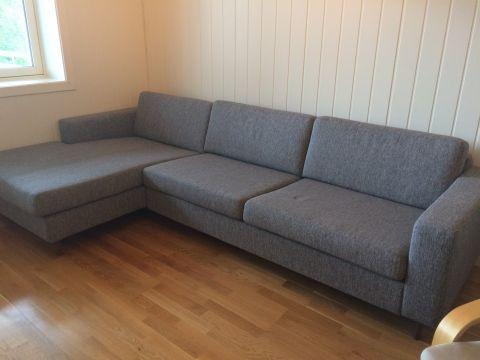

0.8617127
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/70_231993937.jpg


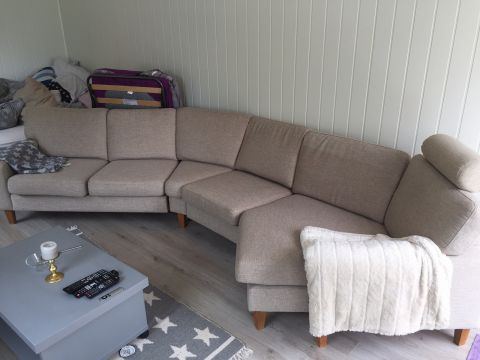

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/27_456436351.jpg


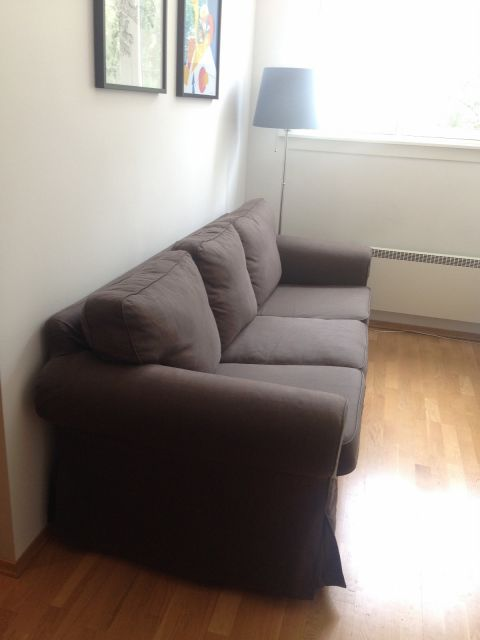

0.86092883
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/93_1957428244.jpg


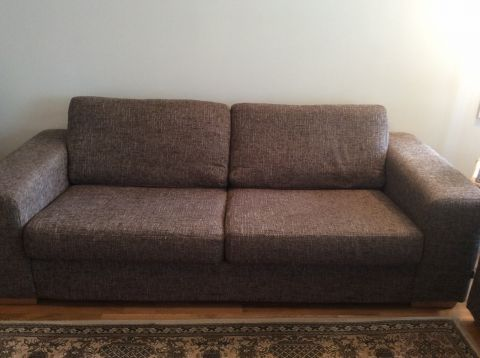

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


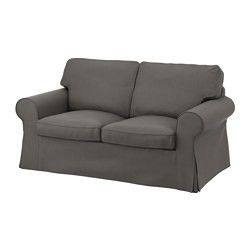

0.86079705
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/93_1957428244.jpg


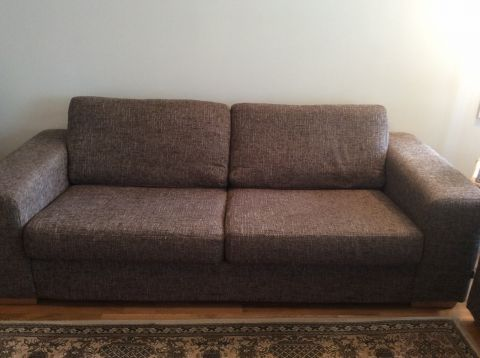

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


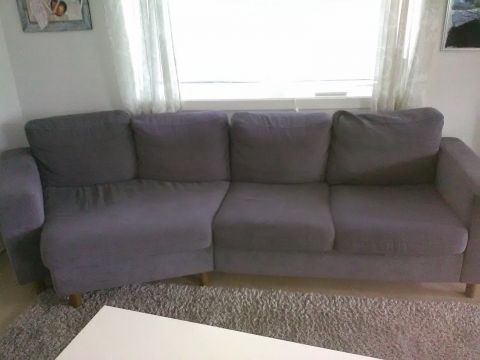

0.8607923
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/29_1742048333.jpg


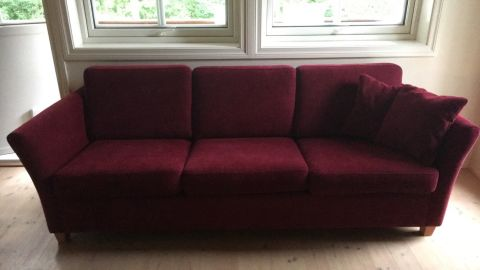

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


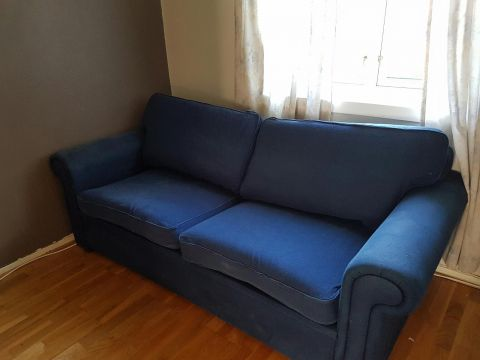

0.8605033
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_1963824245.jpg


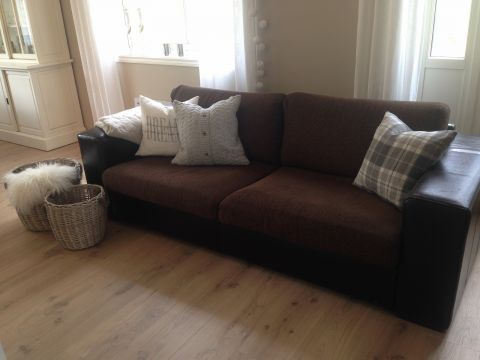

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/27_456436351.jpg


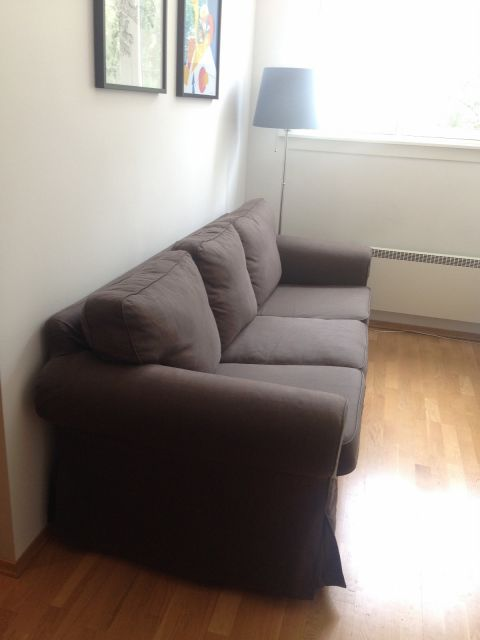

0.8601534
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/62_628116912.jpg


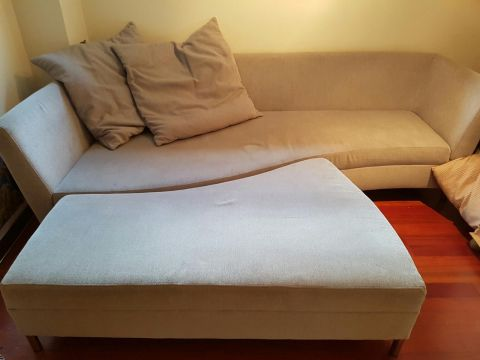

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/28_1669977299.jpg


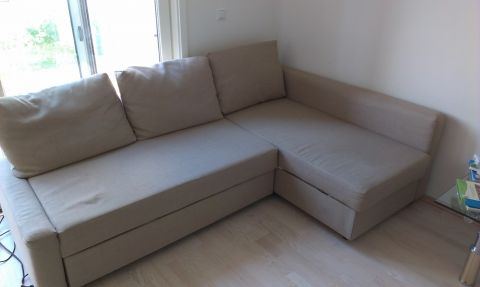

0.8599989
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/28_1669977299.jpg


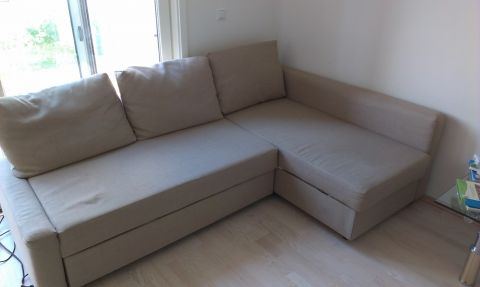

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


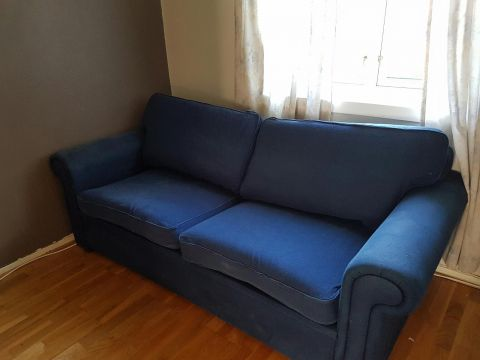

0.85917985
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/59_1918146649.jpg


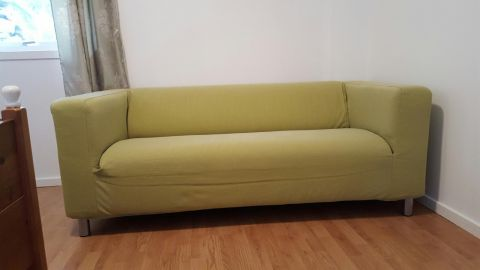

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


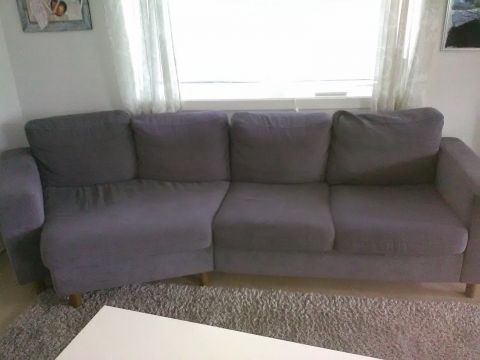

0.8591575
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/59_1918146649.jpg


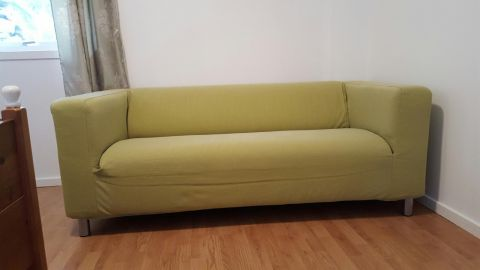

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/28_1669977299.jpg


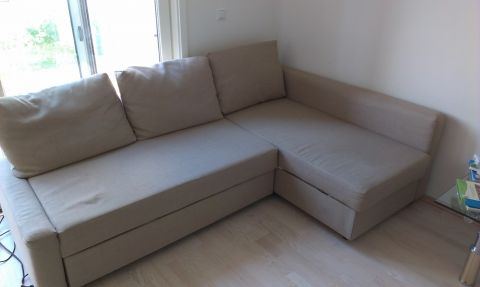

0.85908526
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/55_274624092.jpg


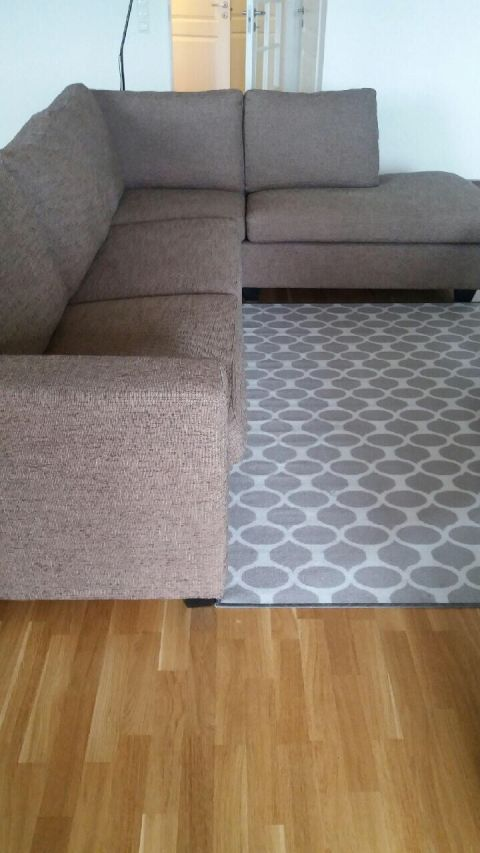

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


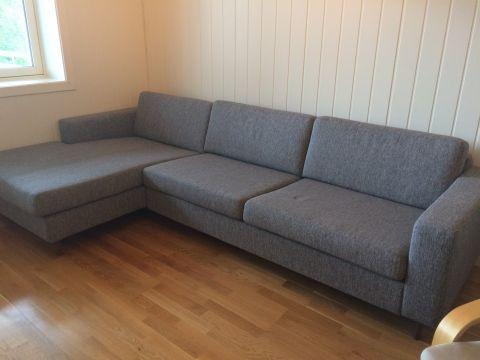

0.8588802
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/27_456436351.jpg


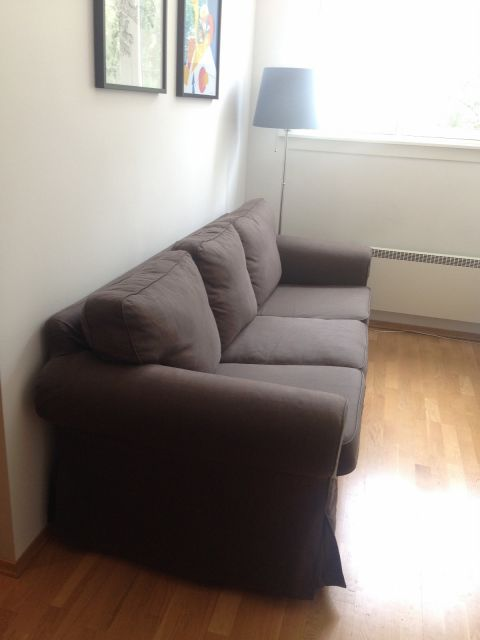

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


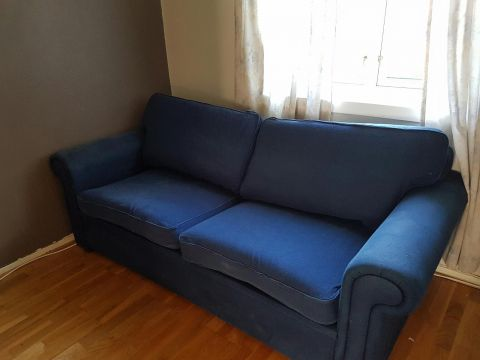

0.858144
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/55_274624092.jpg


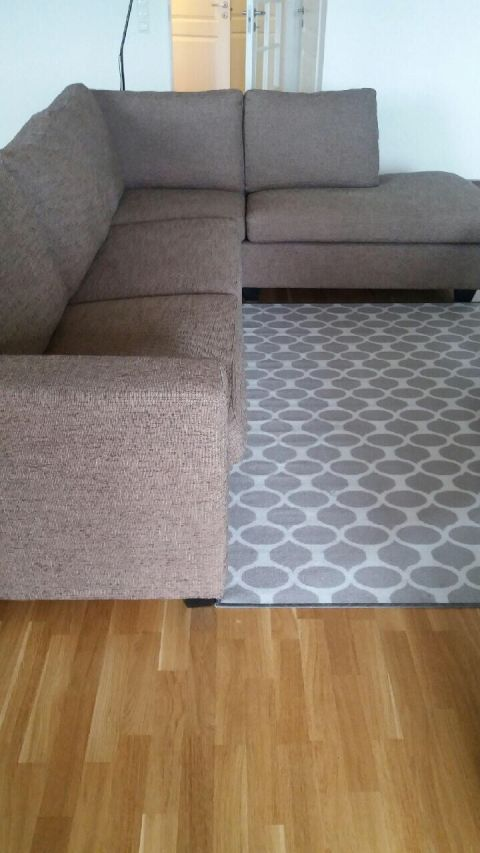

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/27_456436351.jpg


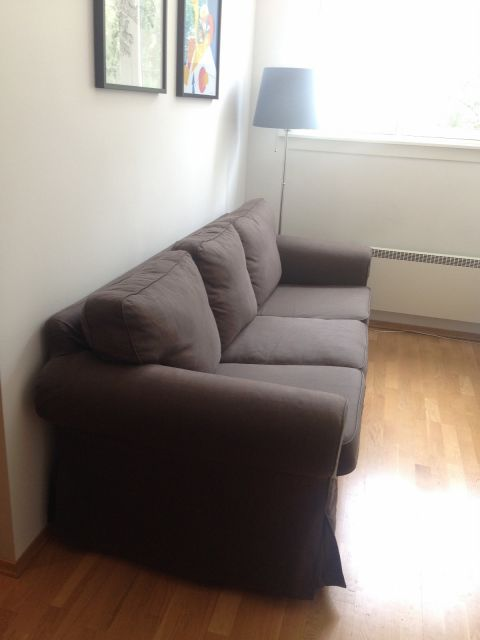

0.8580209
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/27_456436351.jpg


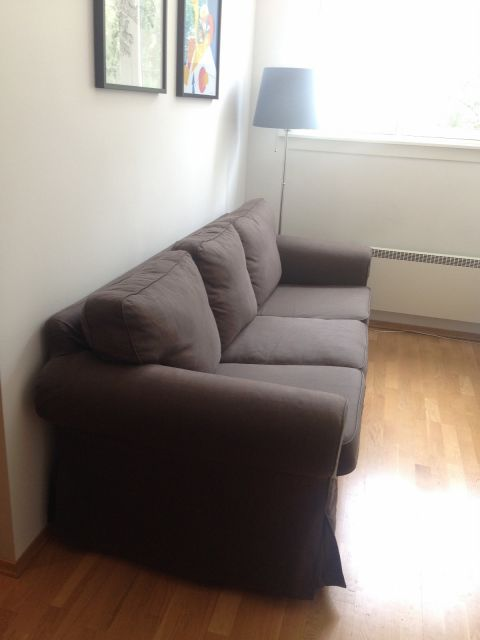

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/49_126067392.jpg


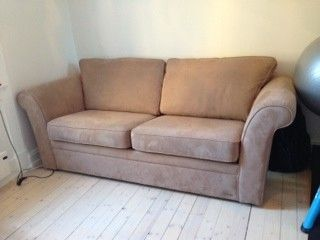

0.8578756
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_787542253.jpg


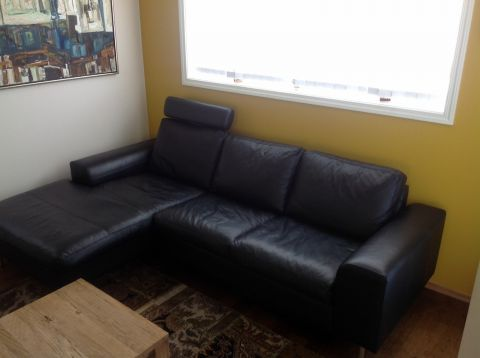

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/67_2077261338.jpg


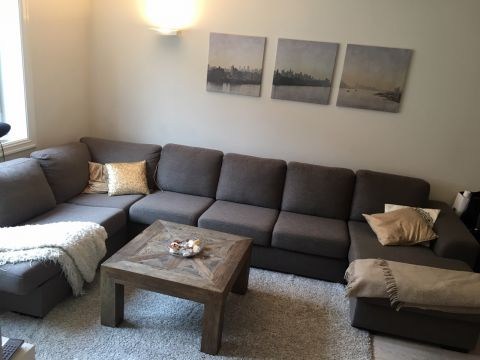

0.8574575
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/72_1016543161.jpg


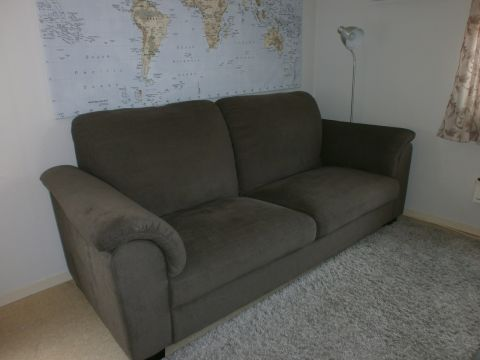

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/67_2077261338.jpg


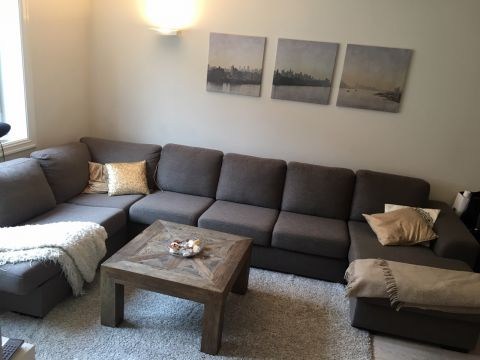

0.85729706
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/70_231993937.jpg


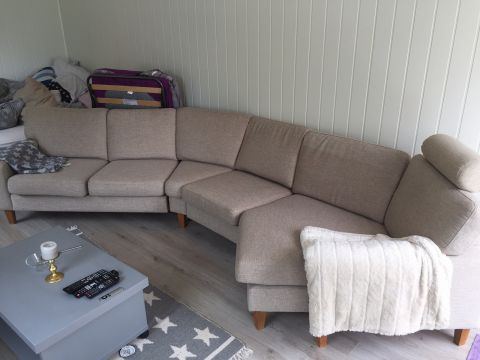

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/55_274624092.jpg


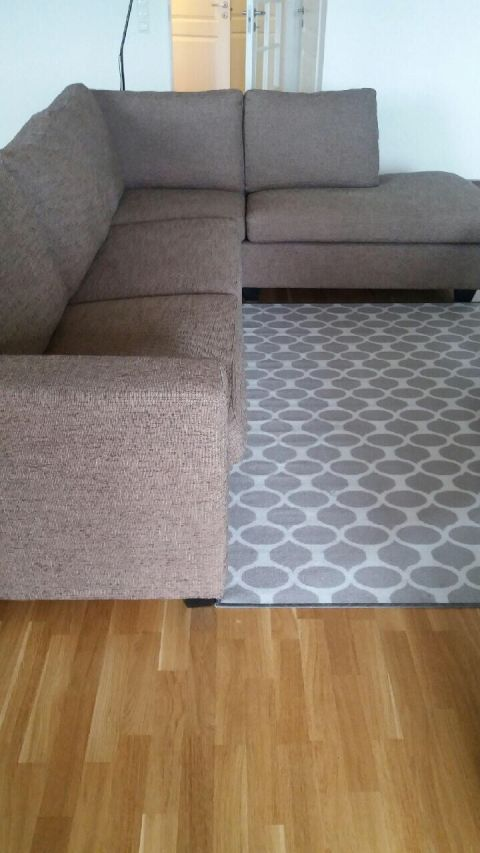

0.857094
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/59_1918146649.jpg


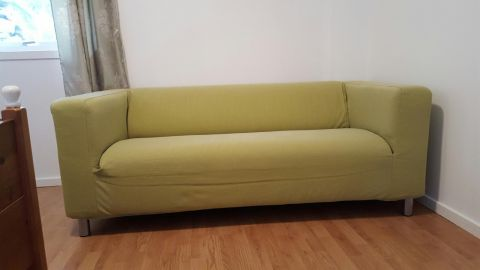

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/29_1742048333.jpg


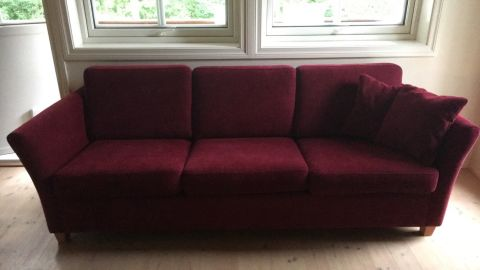

0.856003
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


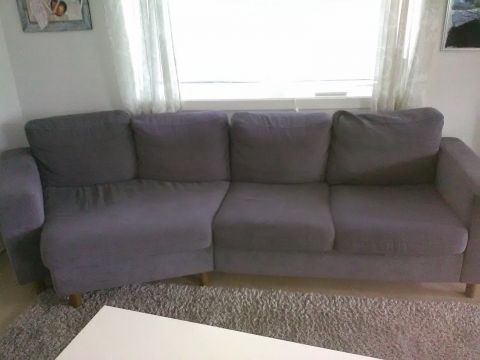

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/30_1186586716.jpg


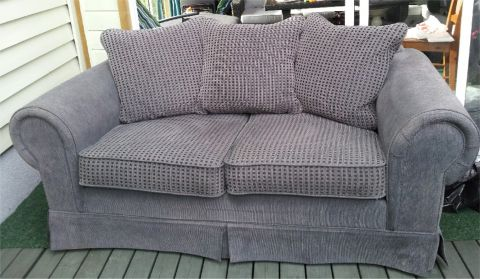

0.8554786
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/59_1918146649.jpg


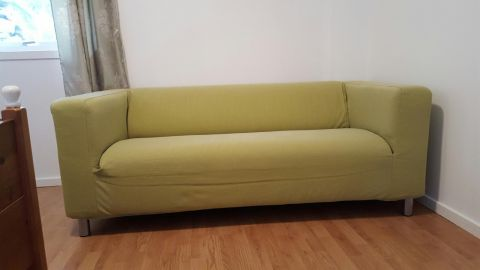

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/72_1016543161.jpg


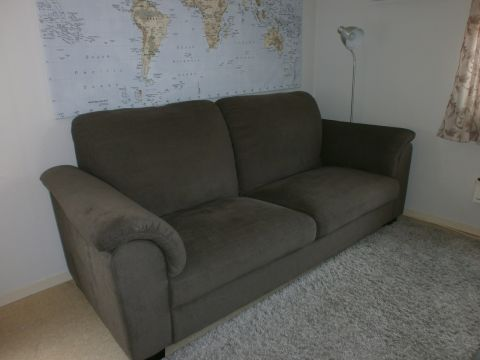

0.8553308
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/72_1016543161.jpg


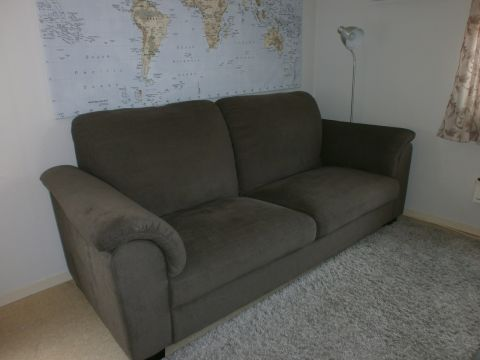

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_787542253.jpg


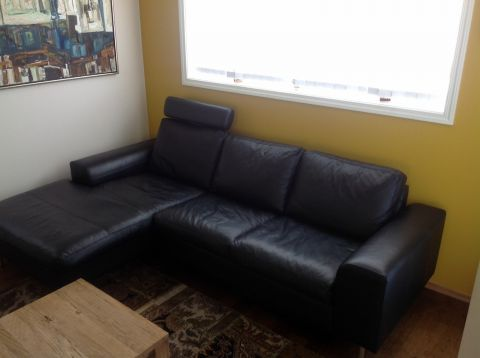

0.8551294
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/70_231993937.jpg


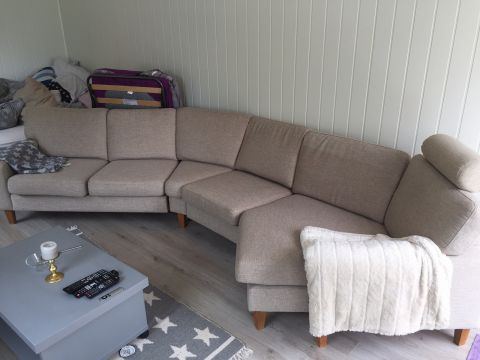

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/67_2077261338.jpg


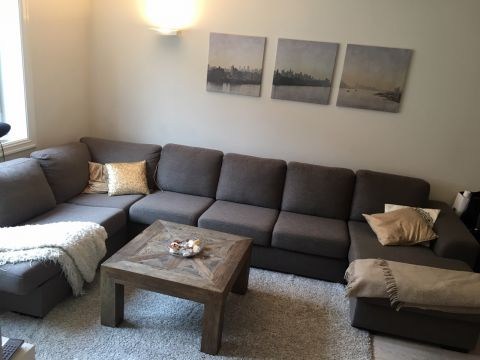

0.854362
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/59_1918146649.jpg


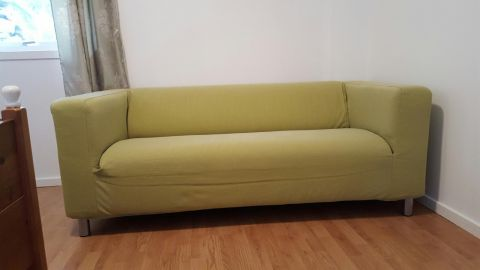

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/65_1302116323.jpg


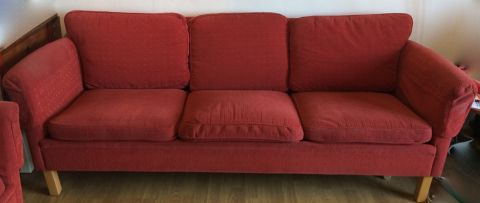

0.8540708
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_469036166.jpg


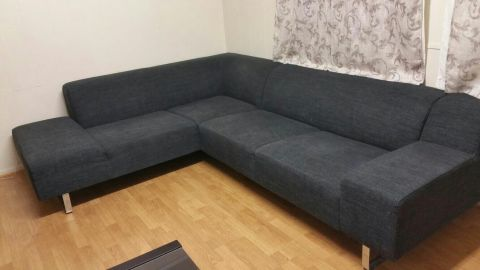

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


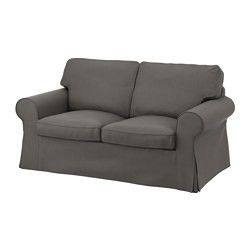

0.8540357
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/72_1016543161.jpg


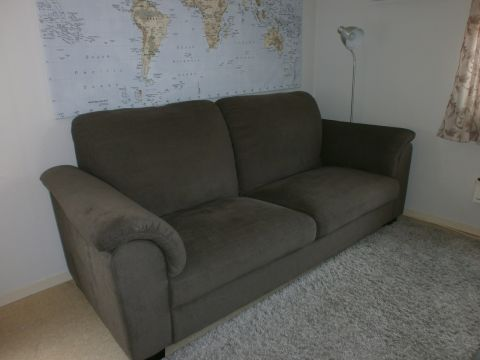

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_469036166.jpg


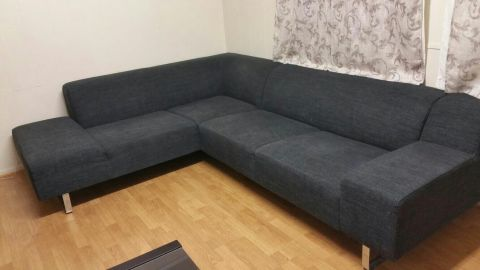

0.85307944
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/70_231993937.jpg


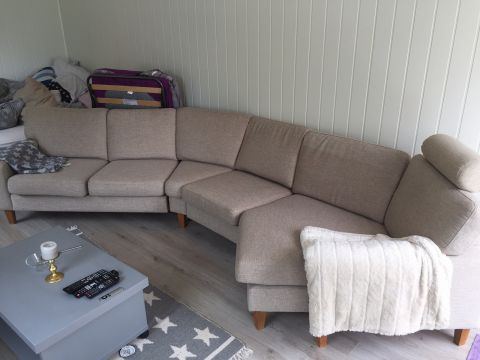

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


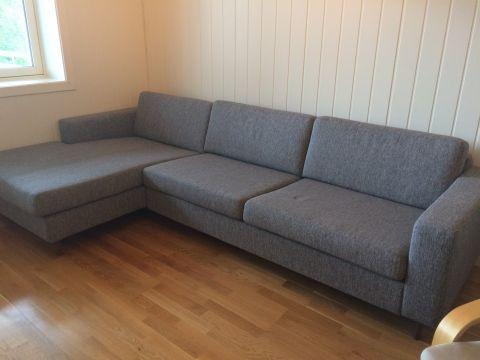

0.852712
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/06_935145396.jpg


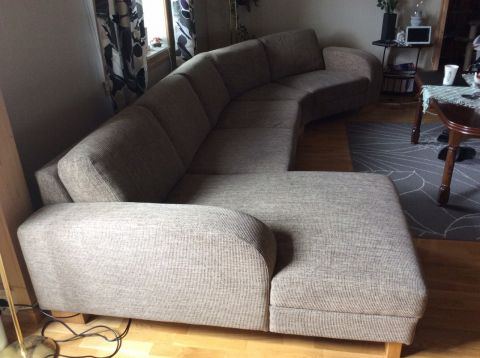

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1045416264.jpg


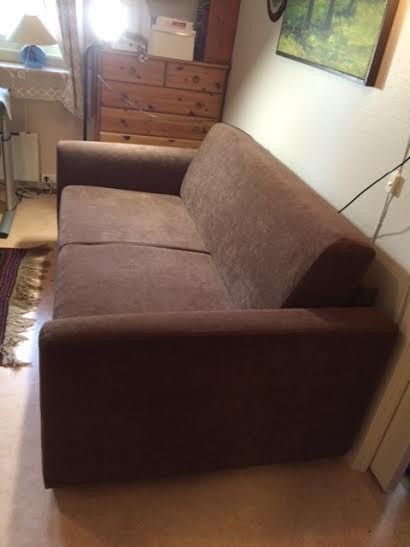

0.852107
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/70_231993937.jpg


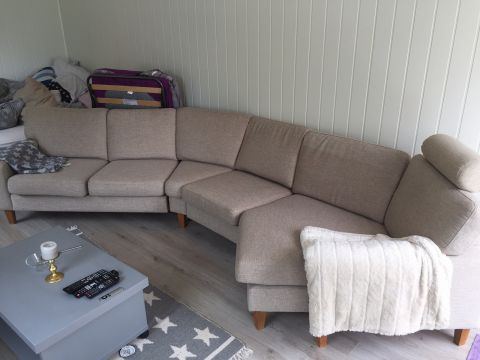

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


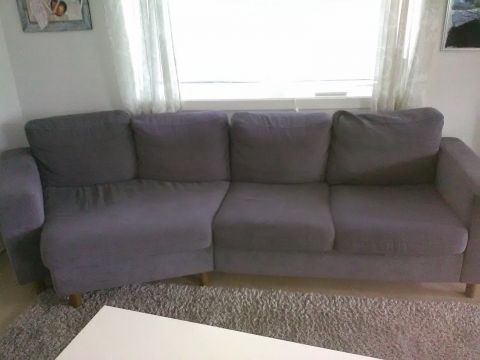

0.851722
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/62_628116912.jpg


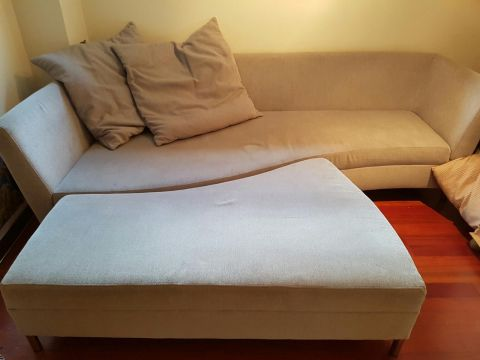

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/49_126067392.jpg


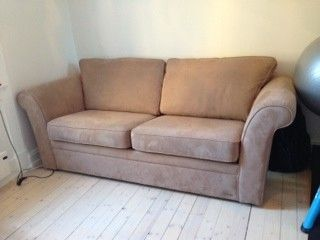

0.85162747
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


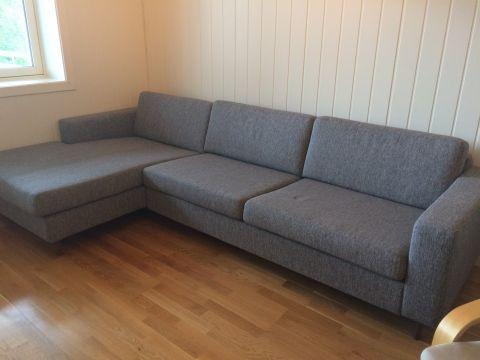

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


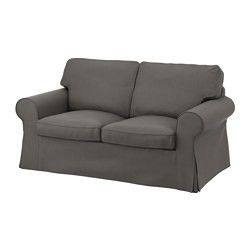

0.85147613
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1594465935.jpg


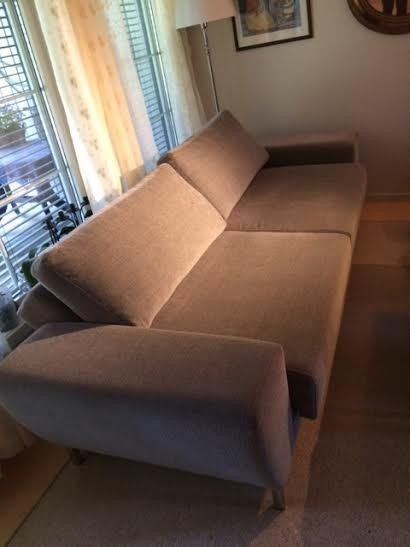

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/10_1855263398.jpg


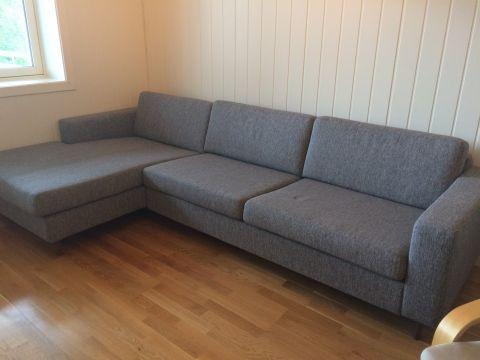

0.85140425
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_96412658.jpg


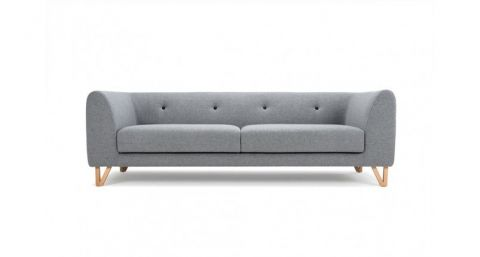

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


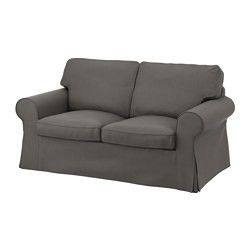

0.8510965
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/28_1669977299.jpg


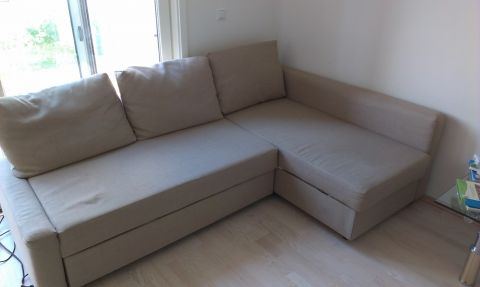

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/49_126067392.jpg


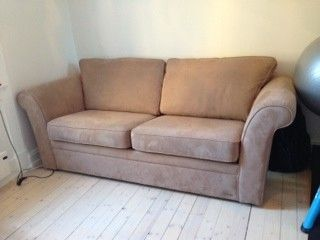

0.85093355
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/27_456436351.jpg


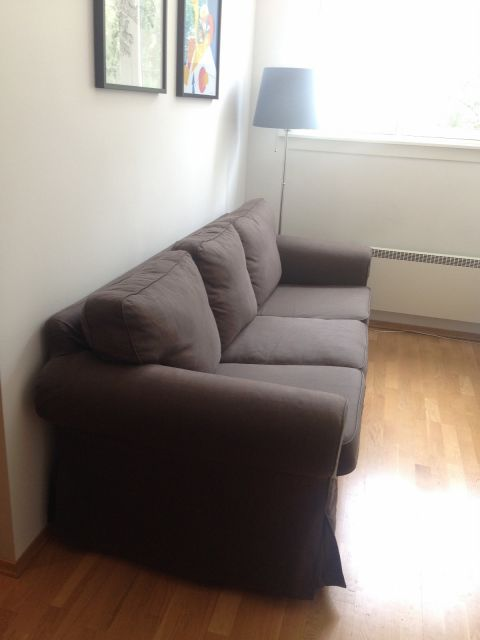

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1045416264.jpg


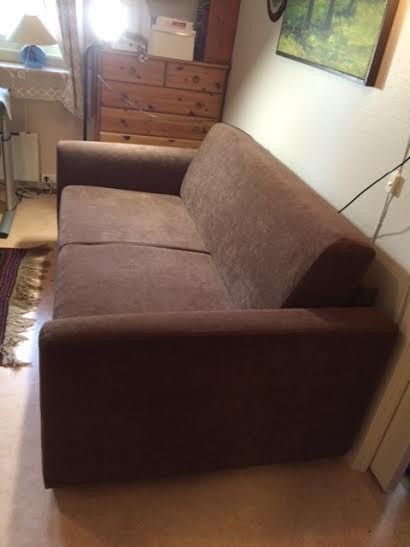

0.85057247
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/49_126067392.jpg


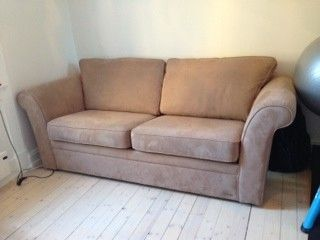

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/67_2077261338.jpg


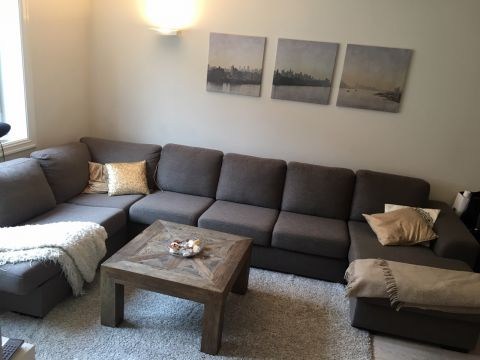

0.8505148
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_469036166.jpg


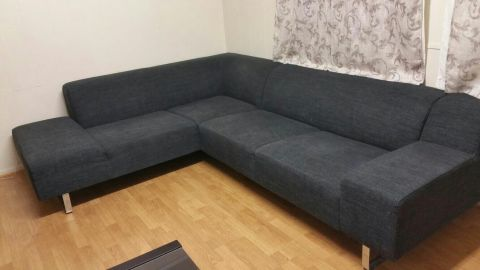

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_1792790436.jpg


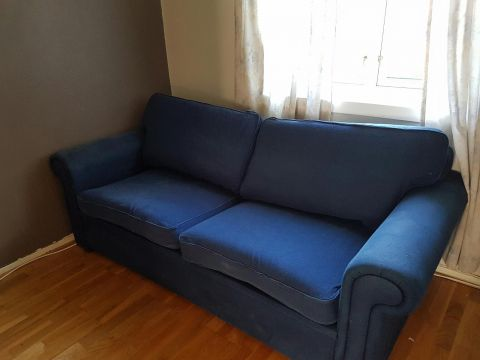

0.8503889
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/49_126067392.jpg


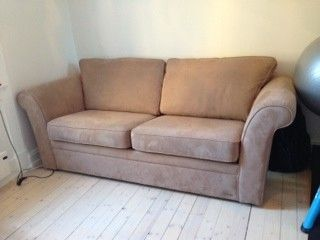

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


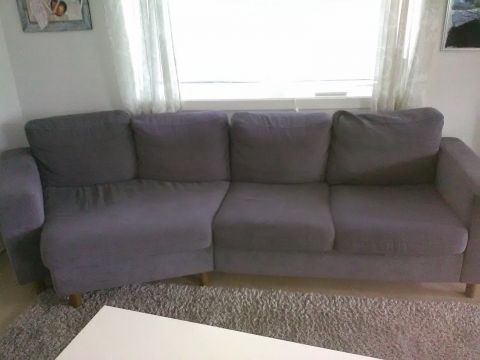

0.8500797
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/56_1228369496.jpg


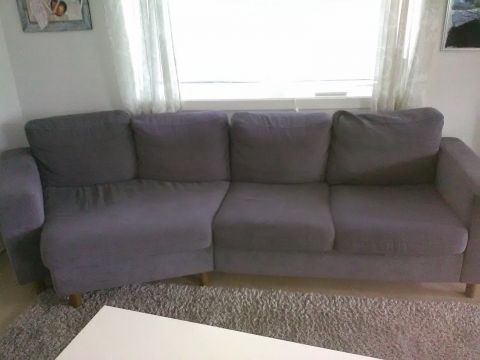

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/50_469036166.jpg


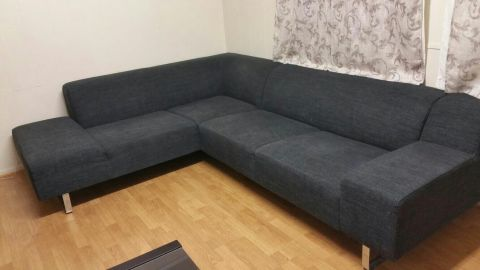

In [24]:
for i, j in above_threshold.index:
  print(above_threshold[i,j])
  print(imagePathsDup[i])
  display(Image(filename=imagePathsDup[i]))
  print(imagePathsDup[j])
  display(Image(filename=imagePathsDup[j]))


### Comment
Lower the score, more dissimilar the images are. 

The score based on the background should be probably set to > **0.91** if we search for dupilcates. With more 'background' data the threshold estimation would be probabbly more accurate.

This was just a test with one arbitrary used neural network and type of layer. There is more possibilities to experiment with this method tweaking the code or using "out-of-the-shelf" python library *img2vec*

## Img2vec library

In [25]:
!pip install img2vec_pytorch



In [26]:
from img2vec_pytorch import Img2Vec
from imutils import paths
import PIL

path_to_images_dup="/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/"
path_to_images_nondup="/content/drive/MyDrive/Advenita-assignment/Non-duplicate-ads/"


In [27]:
imagePathsDup = list(paths.list_images(path_to_images_dup))
imagePathsNondup = list(paths.list_images(path_to_images_nondup))


In [39]:

# Initialize Img2Vec with GPU
img2vec = Img2Vec(cuda=True, model='efficientnet_b0')
# Read in an image (rgb format)
images_duplicated = [PIL.Image.open(img_path) for img_path in list(paths.list_images(path_to_images_dup))]
images_nonduplicated = [PIL.Image.open(img_path) for img_path in list(paths.list_images(path_to_images_nondup))]

# Or submit a list
vectors_dup = img2vec.get_vec(images_duplicated)
vectors_nondup = img2vec.get_vec(images_nonduplicated)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-3dd342df.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-3dd342df.pth


  0%|          | 0.00/20.5M [00:00<?, ?B/s]

In [40]:
vectors_dup.shape

(110, 1280)

In [41]:
cosine_dist_dup_efficientNet = embeddings_to_cosine_similarity_matrix(torch.tensor(vectors_dup))
cosine_dist_nondup_efficientNet = embeddings_to_cosine_similarity_matrix(torch.tensor(vectors_nondup))

In [42]:
cosine_dist_dup_flat_efficientNet = cosine_similarity_matrix_flatten(cosine_dist_dup_efficientNet)
cosine_dist_nondup_flat_efficientNet = cosine_similarity_matrix_flatten(cosine_dist_nondup_efficientNet)


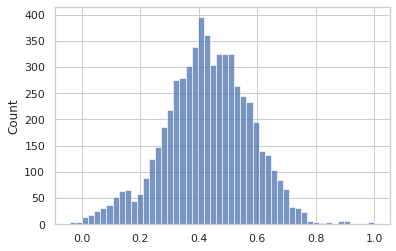

In [43]:
sns.set(style="whitegrid")
sns.histplot(data=cosine_dist_dup_flat_efficientNet)
plt.show()

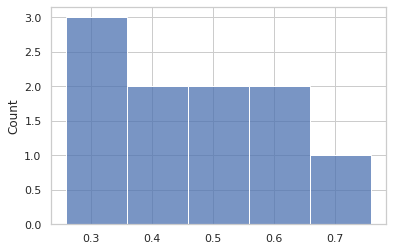

In [44]:
sns.set(style="whitegrid")
sns.histplot(data=cosine_dist_nondup_flat_efficientNet)
plt.show()

In [52]:
above_threshold = cosine_dist_dup_flat_efficientNet[cosine_dist_dup_flat_efficientNet>0.84]

1.0
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


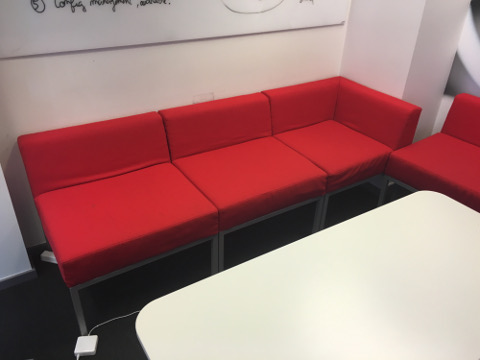

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


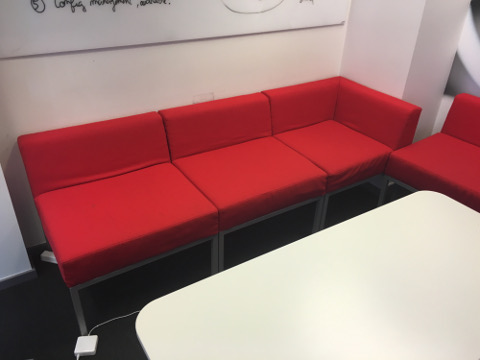

0.99970895
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


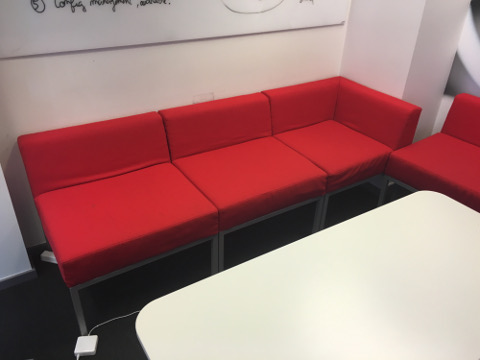

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


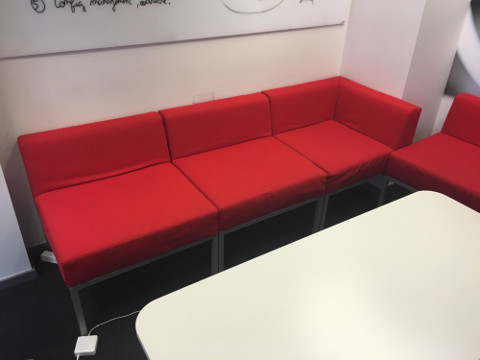

0.99970895
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


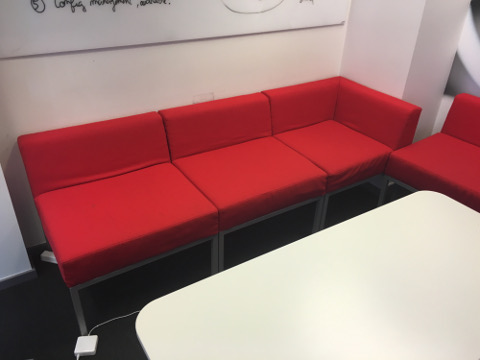

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


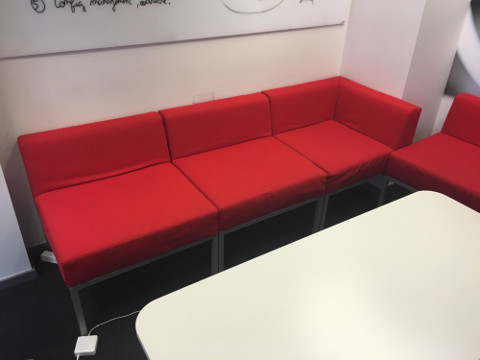

0.99585676
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/60_2091951686.jpg


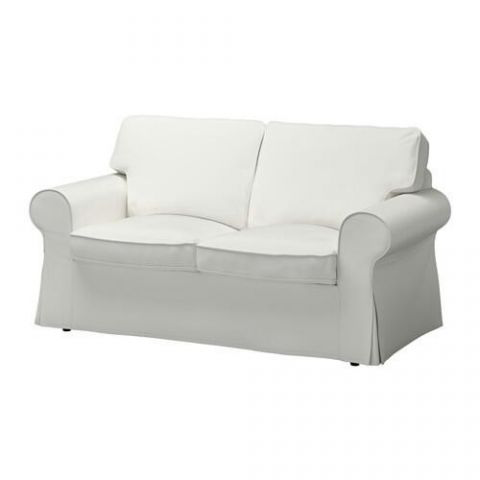

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1490708845.jpg


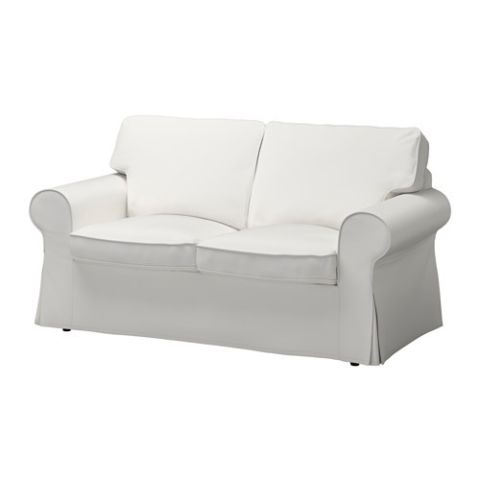

0.94584477
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg


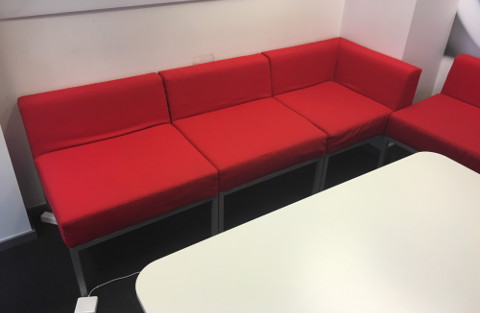

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/17_828296168.jpg


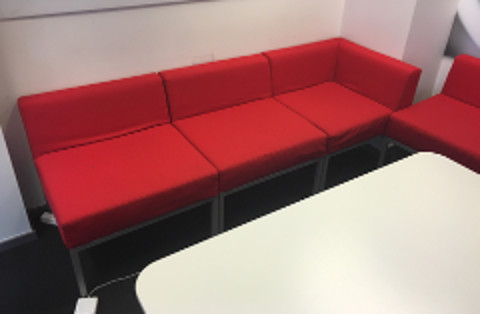

0.9173417
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


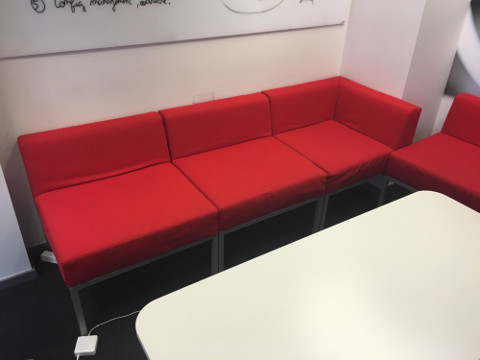

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg


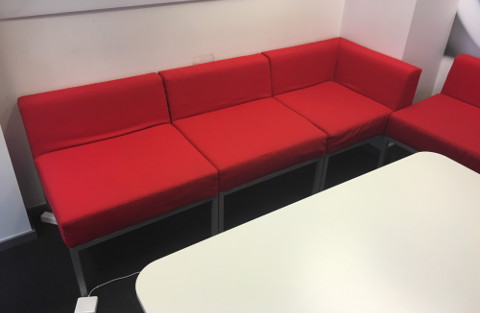

0.91608304
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


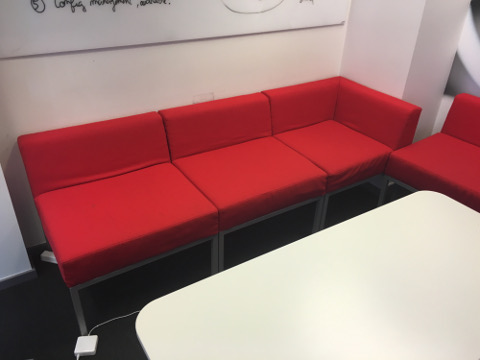

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg


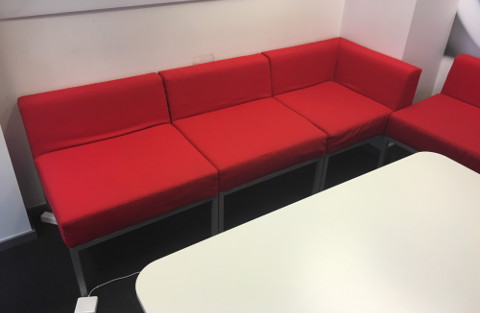

0.91608304
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


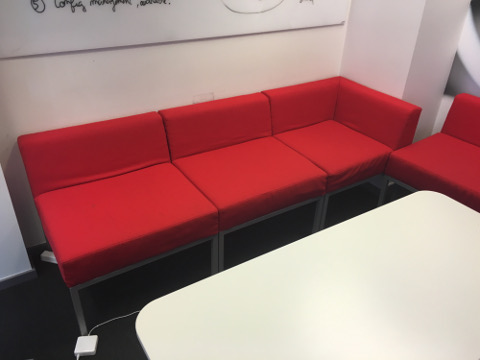

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg


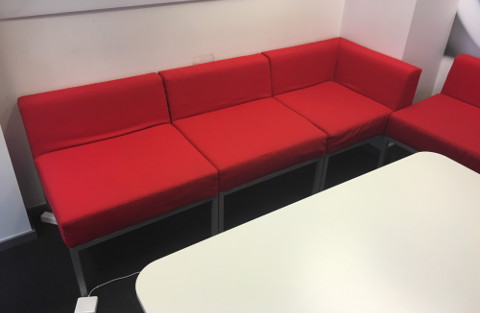

0.9040865
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/66_642824605.jpg


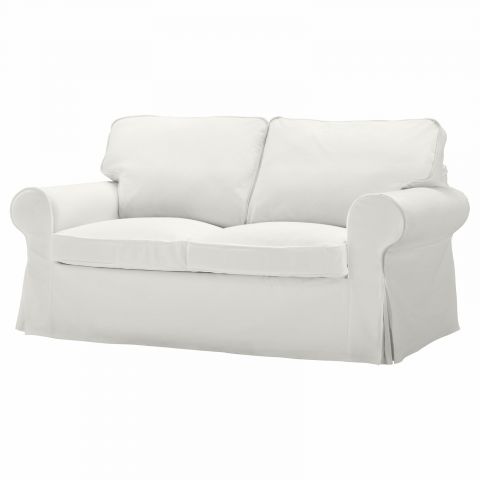

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/37_281871104.jpg


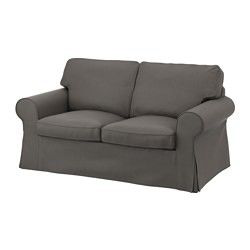

0.9004144
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


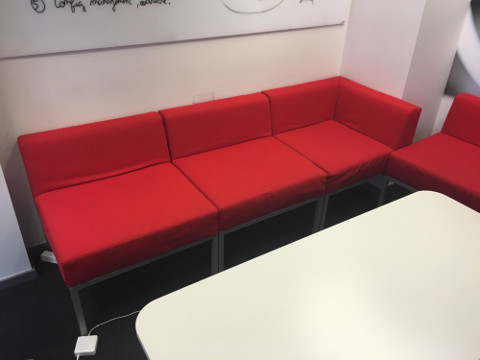

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/17_828296168.jpg


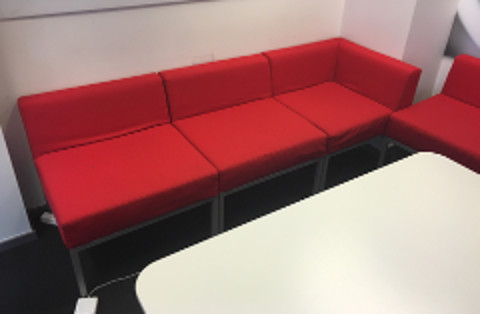

0.90010893
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


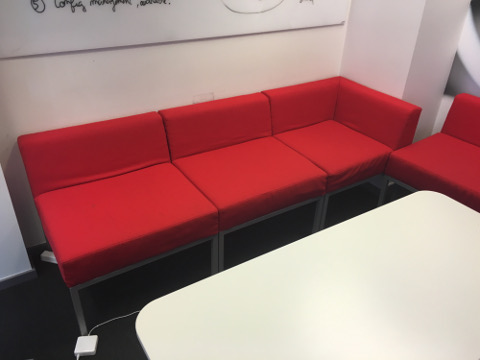

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/17_828296168.jpg


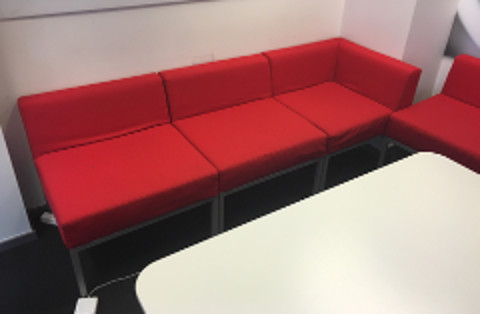

0.90010893
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


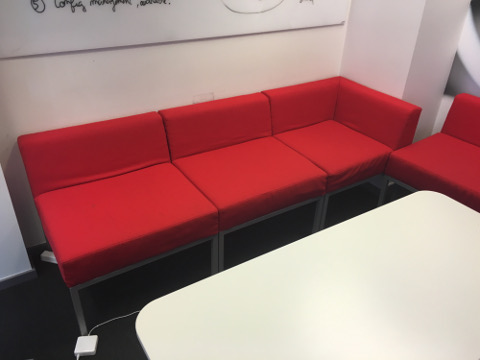

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/17_828296168.jpg


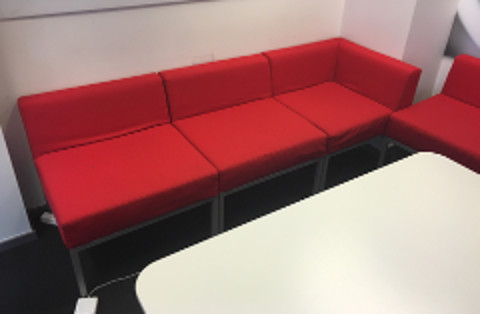

0.8917653
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


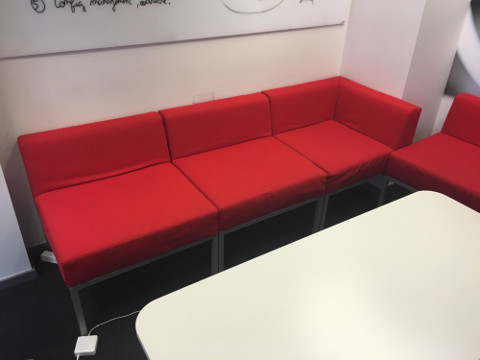

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/88_7139005155.jpg


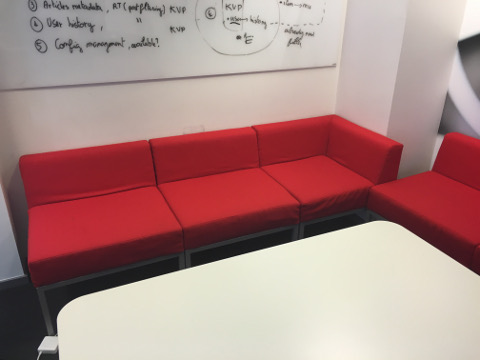

0.8900422
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


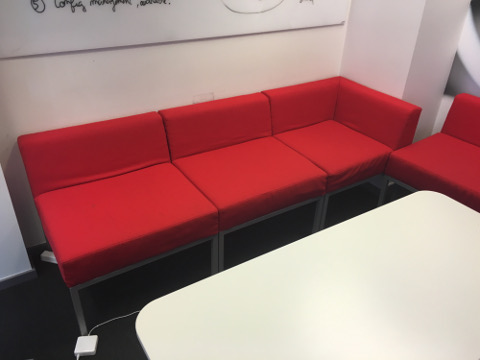

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/88_7139005155.jpg


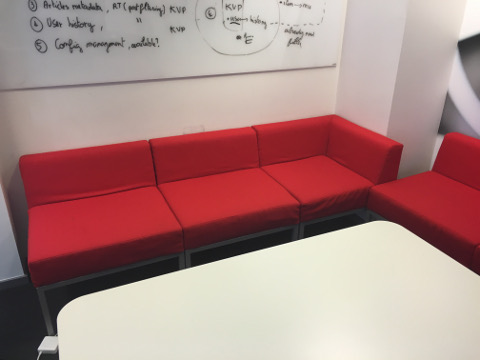

0.8900422
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


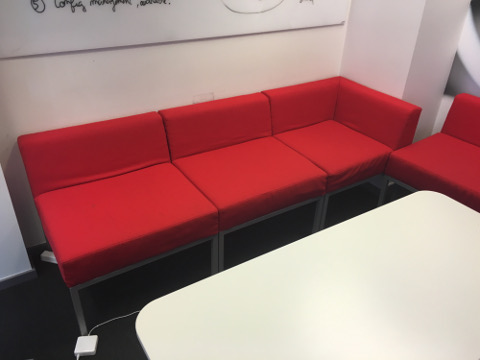

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/88_7139005155.jpg


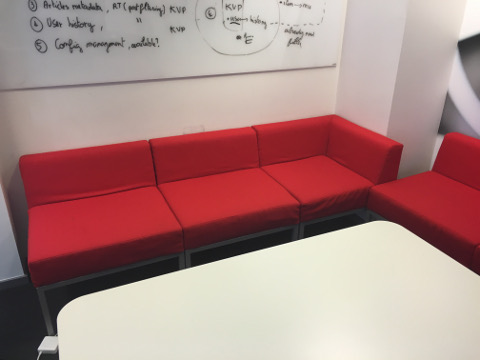

0.88435507
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/26_2614960844.jpg


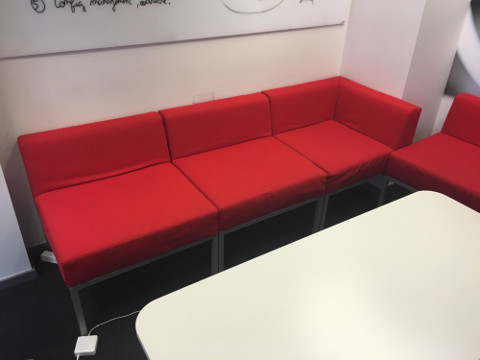

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_758351074.jpg


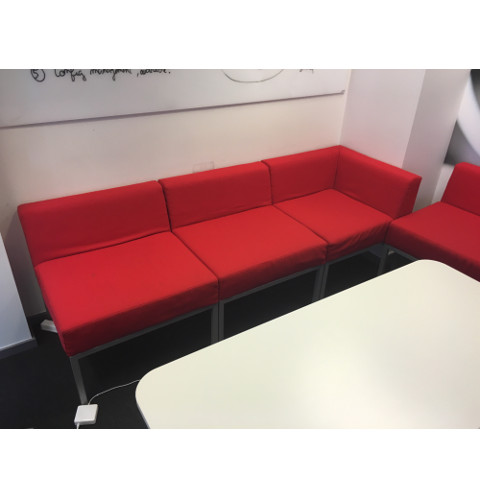

0.8833934
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/51_8126078238.jpg


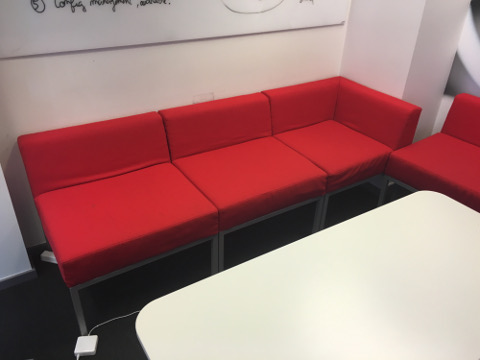

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_758351074.jpg


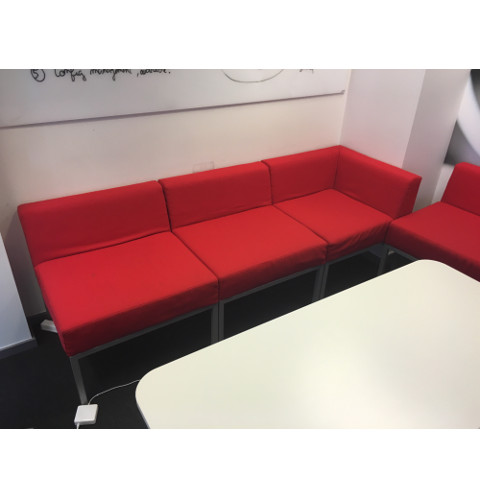

0.8833934
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_6843863532.jpg


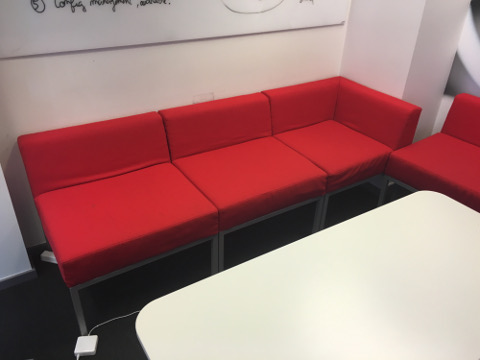

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_758351074.jpg


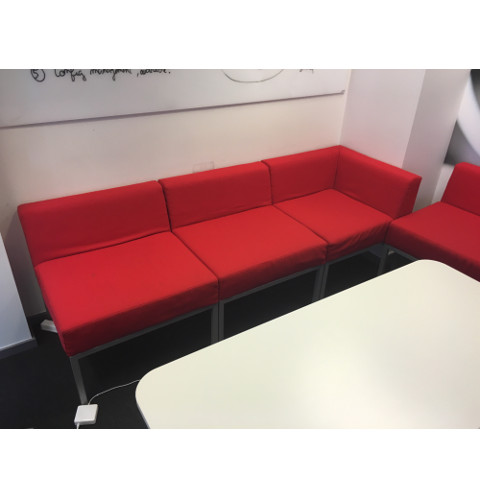

0.84912765
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/25_758351074.jpg


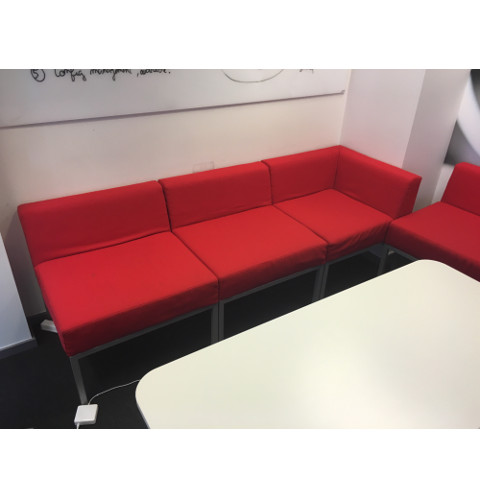

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/82_9428376609.jpg


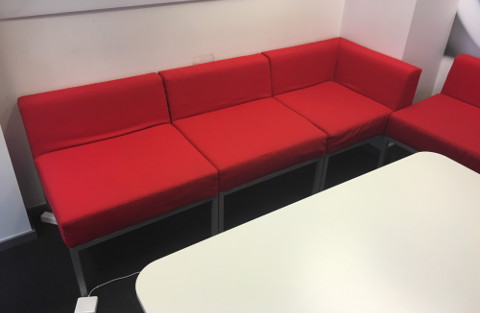

0.84765357
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/66_642824605.jpg


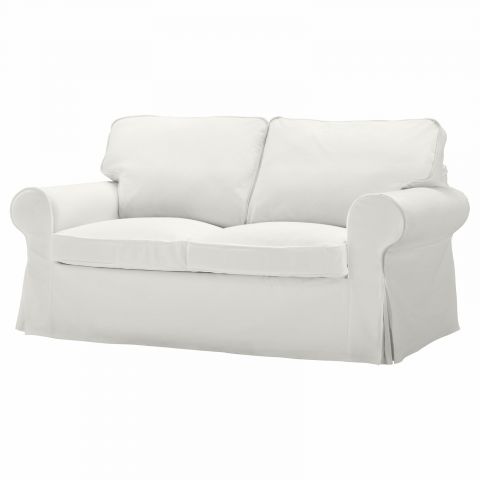

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/l_1490708845.jpg


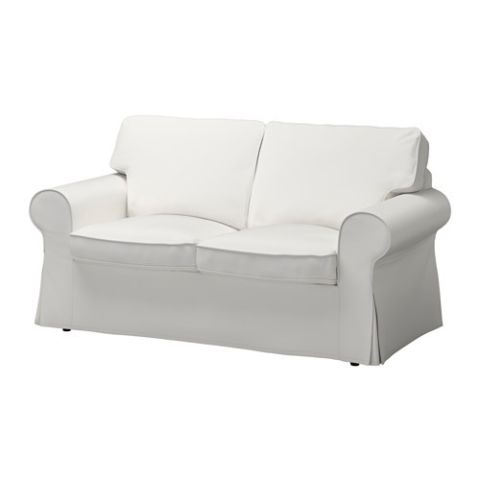

0.84483874
/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/66_642824605.jpg


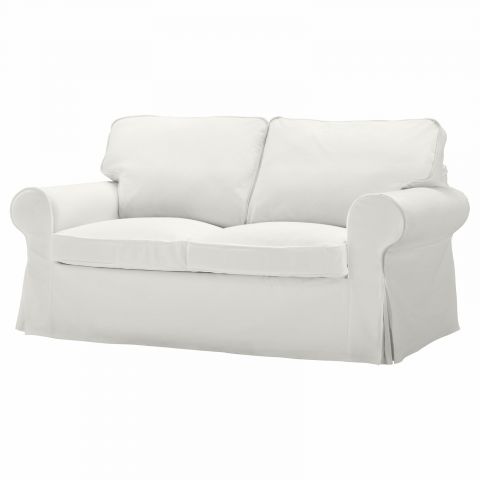

/content/drive/MyDrive/Advenita-assignment/Duplicate-ads/60_2091951686.jpg


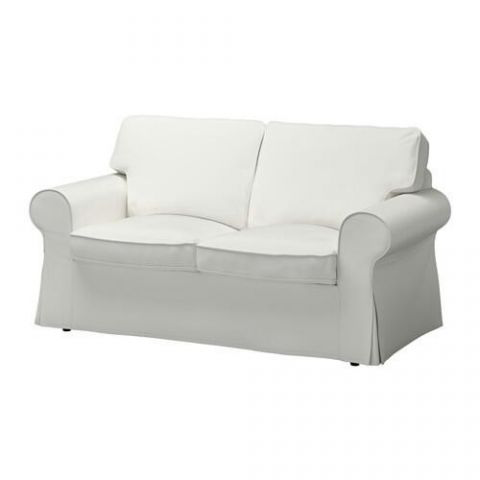

In [53]:
for i, j in above_threshold.index:
  print(above_threshold[i,j])
  print(imagePathsDup[i])
  display(PIL.Image.open(imagePathsDup[i]))
  print(imagePathsDup[j])
  display(PIL.Image.open(imagePathsDup[j]))


### Comment
EfficientNet, first introduced in Tan and Le, 2019 is among the most efficient models (i.e. requiring least FLOPS for inference) that reaches State-of-the-Art accuracy on both imagenet and common image classification transfer learning tasks.

However, it seems to be less suited for our task. Fine tuning would probably help. However to perform fine tuning we would needto have some classified data as the network was trained on a classification task.

# Siamese networks

Siamese network require pair forming i.e. positive image
pairs (near similar images) and negative image pairs (nonsimilar images) for it to learn distance margin ([src](https://arxiv.org/pdf/1709.08761.pdf)).
Instead of a model learning to classify its inputs, the neural networks learns to differentiate between two inputs. It learns the similarity between them.

The code here is strongly inpired by 
https://github.com/harveyslash/Facial-Similarity-with-Siamese-Networks-in-Pytorch/blob/master/Siamese-networks-medium.ipynb
https://hackernoon.com/one-shot-learning-with-siamese-networks-in-pytorch-8ddaab10340e
https://arxiv.org/abs/1707.02131

## Data prequisites

In order to train a siamese network it is necessary to have more trainig data. Images can be duplicated with distorsion, transformations, watermarks and pixel changes, cropping changes. These training pairs can be generated automatically.
I will use part of the provided images. One could also collect more image from web scrapping of different website, for exemple marchendise online stores to get examples of duplicated photos (images taken from different angles, in different interiors).

## data augmentation

In [1]:
from PIL import Image
from imutils import paths
import time
import torch
import torchvision
from torch.utils.data import Dataset
from torchvision import transforms
import albumentations
import albumentations.pytorch
from matplotlib import pyplot as plt
import cv2
import numpy as np

In [17]:
class TorchvisionDataset(Dataset):
    def __init__(self, file_paths, labels, transform=None):
        self.file_paths = file_paths
        self.labels = labels
        self.transform = transform
        
    def __len__(self):
        return len(self.file_paths)

    def __getitem__(self, idx):
        label = self.labels[idx]
        file_path = self.file_paths[idx]
        
        # Read an image with PIL
        image = Image.open(file_path)
        
        if self.transform:
            image = self.transform(image)

        return image, label

In [18]:
path_to_images = "/content/drive/MyDrive/Advenita-assignment/duplicate_ads_train"
imagePaths = list(paths.list_images(path_to_images))

In [19]:
torchvision_transform = transforms.Compose([
    transforms.Resize((256, 256)), 
    transforms.RandomCrop(224),
    transforms.RandomPerspective(0.4),
    transforms.RandomAdjustSharpness(2, p=0.4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
])
torchvision_dataset = TorchvisionDataset(
    file_paths=imagePaths,
    labels=list(np.arange(len(imagePaths))),
    transform=torchvision_transform,
)

In [20]:
! mkdir "/content/drive/MyDrive/Advenita-assignment/duplicate_train_siamese/"

In [21]:
import string
import random
import os
letters = list(string.ascii_lowercase)

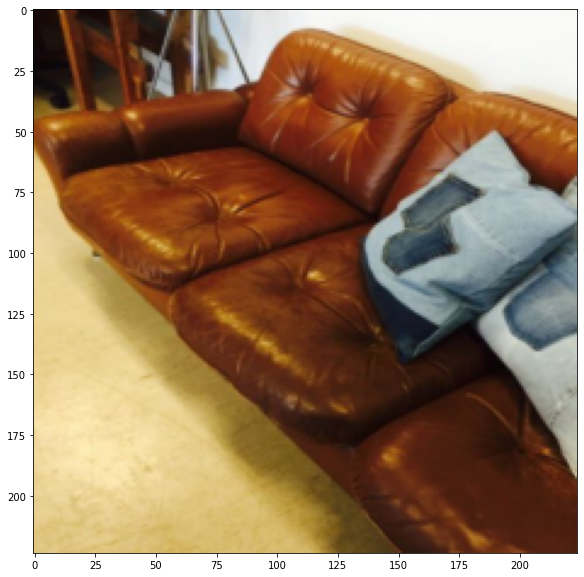

In [22]:
out = "/content/drive/MyDrive/Advenita-assignment/duplicate_train_siamese/"

for x, img in enumerate(torchvision_dataset):
  path_class = f"/content/drive/MyDrive/Advenita-assignment/duplicate_train_siamese/{x}s/"
  for i in range(30):
    sample, _= torchvision_dataset[x]
    if not os.path.exists(path_class):
      os.mkdir(path_class)
    path = f"/content/drive/MyDrive/Advenita-assignment/duplicate_train_siamese/{x}s/{i}-{random.choice(letters)}{random.choice(letters)}.jpg"
    myimg = transforms.ToPILImage()(sample)
    myimg.save(path)
  
 

plt.figure(figsize=(10, 10))
plt.imshow(transforms.ToPILImage()(sample))
plt.show()

In [23]:
%matplotlib inline
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader,Dataset
import matplotlib.pyplot as plt
import torchvision.utils
import numpy as np
import random
from PIL import Image
import torch
from torch.autograd import Variable
import PIL.ImageOps    
import torch.nn as nn
from torch import optim
import torch.nn.functional as F

In [24]:
def imshow(img,text=None,should_save=False):
    npimg = img.numpy()
    plt.axis("off")
    if text:
        plt.text(75, 8, text, style='italic',fontweight='bold',
            bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()    

def show_plot(iteration,loss):
    plt.plot(iteration,loss)
    plt.show()

In [25]:
class Config():
    training_dir = "/content/drive/MyDrive/Advenita-assignment/duplicate_train_siamese/"
    testing_dir = "/content/drive/MyDrive/Advenita-assignment/duplicate_ads_test/"
    train_batch_size = 32
    train_number_epochs = 100

In [26]:
class SiameseNetworkDataset(Dataset):
    
    def __init__(self,imageFolderDataset,transform=None,should_invert=True):
        self.imageFolderDataset = imageFolderDataset    
        self.transform = transform
        self.should_invert = should_invert
        
    def __getitem__(self,index):
        img0_tuple = random.choice(self.imageFolderDataset.imgs)
        #we need to make sure approx 50% of images are in the same class
        should_get_same_class = random.randint(0,1) 
        if should_get_same_class:
            while True:
                #keep looping till the same class image is found
                img1_tuple = random.choice(self.imageFolderDataset.imgs) 
                if img0_tuple[1]==img1_tuple[1]:
                    break
        else:
            while True:
                #keep looping till a different class image is found
                
                img1_tuple = random.choice(self.imageFolderDataset.imgs) 
                if img0_tuple[1] !=img1_tuple[1]:
                    break

        img0 = Image.open(img0_tuple[0])
        img1 = Image.open(img1_tuple[0])
        img0 = img0.convert("L")
        img1 = img1.convert("L")
        
        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform is not None:
            img0 = self.transform(img0)
            img1 = self.transform(img1)
        
        return img0, img1 , torch.from_numpy(np.array([int(img1_tuple[1]!=img0_tuple[1])],dtype=np.float32))
    
    def __len__(self):
        return len(self.imageFolderDataset.imgs)


In [27]:

folder_dataset = dset.ImageFolder(root=Config.training_dir)
siamese_dataset = SiameseNetworkDataset(imageFolderDataset=folder_dataset,
                                        transform=transforms.Compose([transforms.Resize((100,100)),
                                                                      transforms.ToTensor()
                                                                      ])
                                       ,should_invert=False)

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


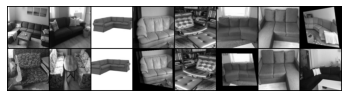

[[1.]
 [1.]
 [0.]
 [0.]
 [0.]
 [0.]
 [0.]
 [1.]]


In [28]:
#Visualising some of the data
#The top row and the bottom row of any column is one pair. The 0s and 1s correspond to the column of the image. 1 indiciates dissimilar, and 0 indicates similar.

vis_dataloader = DataLoader(siamese_dataset,
                        shuffle=True,
                        num_workers=8,
                        batch_size=8)
dataiter = iter(vis_dataloader)


example_batch = next(dataiter)
concatenated = torch.cat((example_batch[0],example_batch[1]),0)
imshow(torchvision.utils.make_grid(concatenated))
print(example_batch[2].numpy())

In [29]:
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(1, 4, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(4),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(4, 8, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(8),


            nn.ReflectionPad2d(1),
            nn.Conv2d(8, 8, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(8),


        )

        self.fc1 = nn.Sequential(
            nn.Linear(8*100*100, 500),
            nn.ReLU(inplace=True),

            nn.Linear(500, 500),
            nn.ReLU(inplace=True),

            nn.Linear(500, 5))

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

In [30]:
class ContrastiveLoss(torch.nn.Module):
    """
    Contrastive loss function.
    Based on: http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    """

    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim = True)
        loss_contrastive = torch.mean((1-label) * torch.pow(euclidean_distance, 2) +
                                      (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))


        return loss_contrastive

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


Epoch number 0
 Current loss 1.8779953718185425

Epoch number 0
 Current loss 9.127423286437988

Epoch number 0
 Current loss 2.6206774711608887

Epoch number 0
 Current loss 7.968032360076904

Epoch number 0
 Current loss 1.4912139177322388

Epoch number 0
 Current loss 3.4170637130737305

Epoch number 0
 Current loss 1.3203167915344238

Epoch number 0
 Current loss 1.2065635919570923

Epoch number 0
 Current loss 1.576493740081787

Epoch number 1
 Current loss 2.620985269546509

Epoch number 1
 Current loss 1.176821231842041

Epoch number 1
 Current loss 1.2661676406860352

Epoch number 1
 Current loss 0.8390211462974548

Epoch number 1
 Current loss 0.5448604822158813

Epoch number 1
 Current loss 2.5109102725982666

Epoch number 1
 Current loss 0.9060599207878113

Epoch number 1
 Current loss 1.15511155128479

Epoch number 1
 Current loss 0.8919967412948608

Epoch number 2
 Current loss 3.5825631618499756

Epoch number 2
 Current loss 0.6723753213882446

Epoch number 2
 Current los

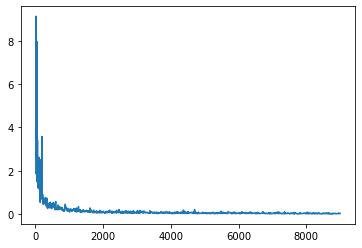

In [31]:
train_dataloader = DataLoader(siamese_dataset,
                        shuffle=True,
                        num_workers=8,
                        batch_size=Config.train_batch_size)
net = SiameseNetwork().cuda()
criterion = ContrastiveLoss()
optimizer = optim.Adam(net.parameters(),lr = 0.0005 )
counter = []
loss_history = [] 
iteration_number= 0
for epoch in range(0,Config.train_number_epochs):
    for i, data in enumerate(train_dataloader,0):
        img0, img1 , label = data
        img0, img1 , label = img0.cuda(), img1.cuda() , label.cuda()
        optimizer.zero_grad()
        output1,output2 = net(img0,img1)
        loss_contrastive = criterion(output1,output2,label)
        loss_contrastive.backward()
        optimizer.step()
        if i %10 == 0 :
            print("Epoch number {}\n Current loss {}\n".format(epoch,loss_contrastive.item()))
            iteration_number +=10
            counter.append(iteration_number)
            loss_history.append(loss_contrastive.item())
show_plot(counter,loss_history)

In [32]:
torch.save(net.state_dict(), "/content/drive/MyDrive/Advenita-assignment/siamese-model-2.pt")


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


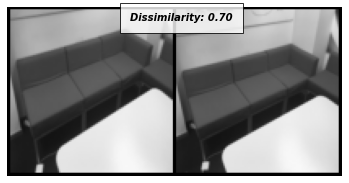

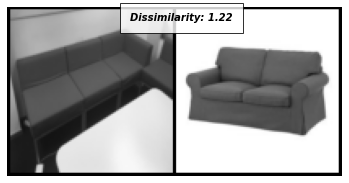

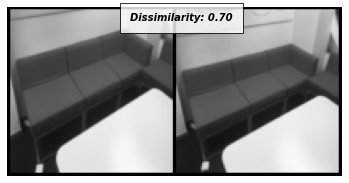

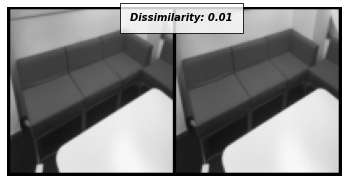

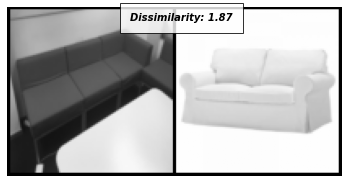

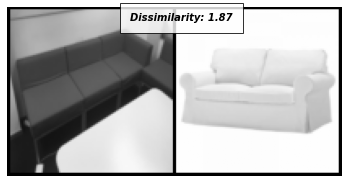

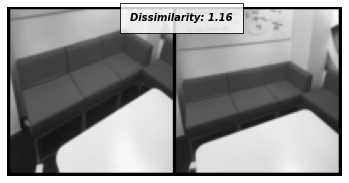

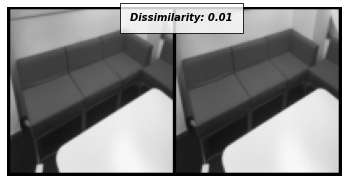

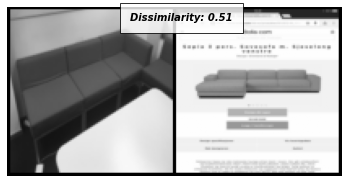

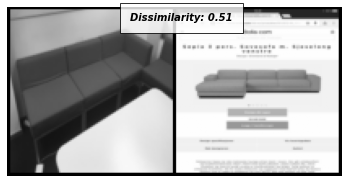

In [42]:
folder_dataset_test = dset.ImageFolder(root=Config.testing_dir)
siamese_dataset = SiameseNetworkDataset(imageFolderDataset=folder_dataset_test,
                                        transform=transforms.Compose([transforms.Resize((100,100)),
                                                                      transforms.ToTensor()
                                                                      ])
                                       ,should_invert=False)

test_dataloader = DataLoader(siamese_dataset,num_workers=6,batch_size=1,shuffle=True)
dataiter = iter(test_dataloader)
x0,_,_ = next(dataiter)

for i in range(10):
    _,x1,label2 = next(dataiter)
    concatenated = torch.cat((x0,x1),0)
    
    output1,output2 = net(Variable(x0).cuda(),Variable(x1).cuda())
    euclidean_distance = F.pairwise_distance(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated),'Dissimilarity: {:.2f}'.format(euclidean_distance.item()))

## Testing different distance measures

### Cosine

/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


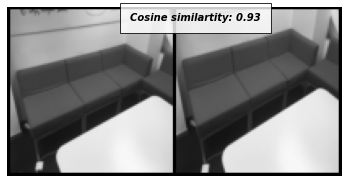

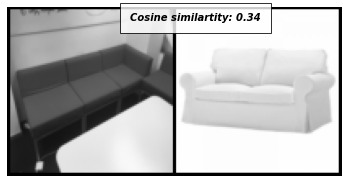

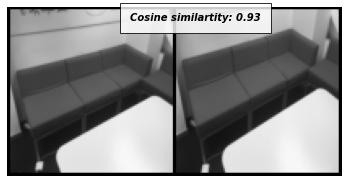

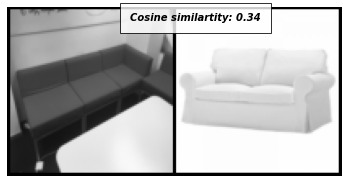

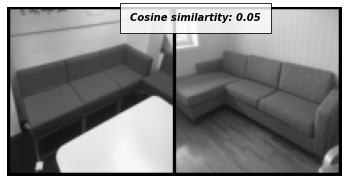

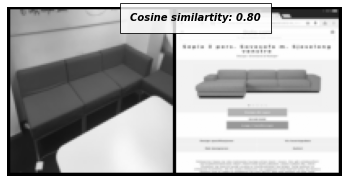

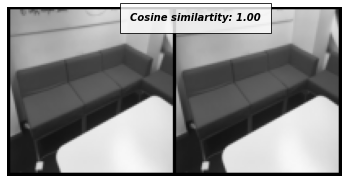

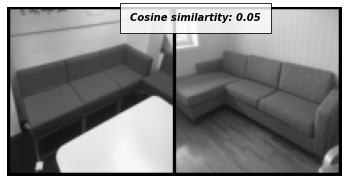

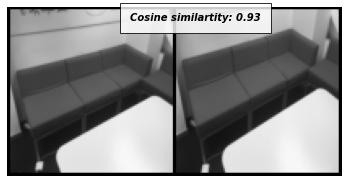

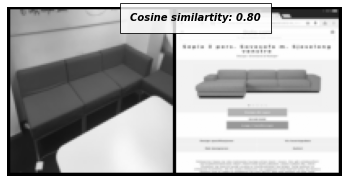

In [35]:
test_dataloader = DataLoader(siamese_dataset,num_workers=6,batch_size=1,shuffle=True)
dataiter = iter(test_dataloader)
x0,_,_ = next(dataiter)

for i in range(10):
    _,x1,label2 = next(dataiter)
    concatenated = torch.cat((x0,x1),0)
    
    output1,output2 = net(Variable(x0).cuda(),Variable(x1).cuda())
    cosine_similarity = F.cosine_similarity(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated),'Cosine similartity: {:.2f}'.format(cosine_similarity.item()))

## Normalized Euclidean distance

In [43]:
# source: https://github.com/brando90/Normalized-Euclidean-Distance-and-Similarity-NED-NES-/blob/main/main_ned_nes.py

import torch

def ned_torch(x1: torch.Tensor, x2: torch.Tensor, dim=1, eps=1e-8) -> torch.Tensor:
    """
    Normalized eucledian distance in pytorch.
    Cases:
        1. For comparison of two vecs directly make sure vecs are of size [B] e.g. when using nes as a loss function.
            in this case each number is not considered a representation but a number and B is the entire vector to
            compare x1 and x2.
        2. For comparison of two batch of representation of size 1D (e.g. scores) make sure it's of shape [B, 1].
            In this case each number *is* the representation of the example. Thus a collection of reps
            [B, 1] is mapped to a rep of size [B]. Note usually D does decrease since reps are not of size 1
            (see case 3)
        3. For the rest specify the dimension. Common use case [B, D] -> [B, 1] for comparing two set of
            activations of size D. In the case when D=1 then we have [B, 1] -> [B, 1]. If you meant x1, x2 [D, 1] to be
            two vectors of size D to be compare feed them with shape [D].
            This one is also good for computing the NED for two batches of values. e.g. if you have a tensor of size
            [B, k] and the row is a batch and each entry is the y value for that batch. If a batch is a task then
            it is computing the NED for that task, which is good because that batch has it's own unique scale that
            we are trying to normalize and by doing it per task you are normalizing it as you'd expect (i.e. per task).
    Note: you cannot use this to compare two single numbers NED(x,y) is undefined because a single number does not have
    a variance. Variance[x] = undefined.
    https://discuss.pytorch.org/t/how-does-one-compute-the-normalized-euclidean-distance-similarity-in-a-numerically-stable-way-in-a-vectorized-way-in-pytorch/110829
    https://stats.stackexchange.com/questions/136232/definition-of-normalized-euclidean-distance/498753?noredirect=1#comment937825_498753
    https://github.com/brando90/Normalized-Euclidean-Distance-and-Similarity
    """
    # to compute ned for two individual vectors e.g to compute a loss (NOT BATCHES/COLLECTIONS of vectorsc)
    if len(x1.size()) == 1:
        # [K] -> [1]
        ned_2 = 0.5 * ((x1 - x2).var() / (x1.var() + x2.var() + eps))
    # if the input is a (row) vector e.g. when comparing two batches of acts of D=1 like with scores right before sf
    elif x1.size() == torch.Size([x1.size(0), 1]):  # note this special case is needed since var over dim=1 is nan (1 value has no variance).
        # [B, 1] -> [B]
        ned_2 = 0.5 * ((x1 - x2)**2 / (x1**2 + x2**2 + eps)).squeeze()  # Squeeze important to be consistent with .var, otherwise tensors of different sizes come out without the user expecting it
    # common case is if input is a batch
    else:
        # e.g. [B, D] -> [B]
        ned_2 = 0.5 * ((x1 - x2).var(dim=dim) / (x1.var(dim=dim) + x2.var(dim=dim) + eps))
    return ned_2 ** 0.5

def nes_torch(x1, x2, dim=1, eps=1e-8):
    return 1 - ned_torch(x1, x2, dim, eps)


/usr/local/lib/python3.7/dist-packages/torch/utils/data/dataloader.py:481: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  cpuset_checked))


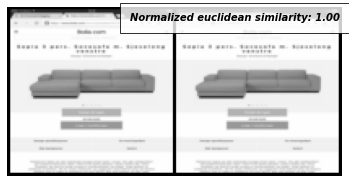

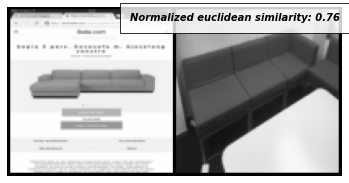

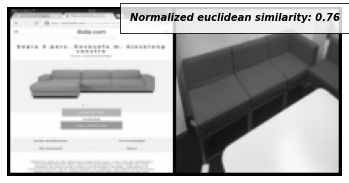

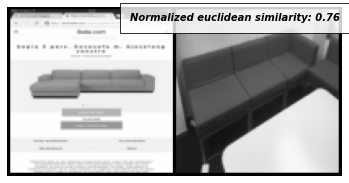

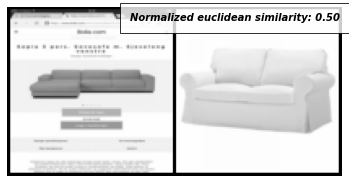

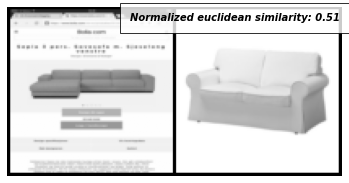

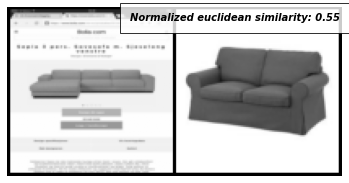

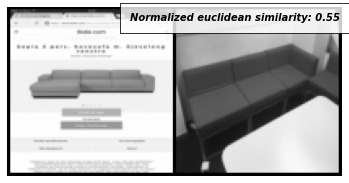

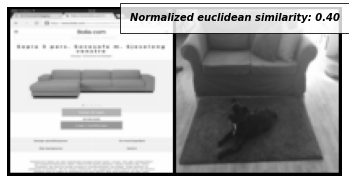

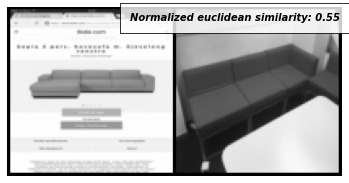

In [45]:
folder_dataset_test = dset.ImageFolder(root=Config.testing_dir)
siamese_dataset = SiameseNetworkDataset(imageFolderDataset=folder_dataset_test,
                                        transform=transforms.Compose([transforms.Resize((100,100)),
                                                                      transforms.ToTensor()
                                                                      ])
                                       ,should_invert=False)

test_dataloader = DataLoader(siamese_dataset,num_workers=6,batch_size=1,shuffle=True)
dataiter = iter(test_dataloader)
x0,_,_ = next(dataiter)

for i in range(10):
    _,x1,label2 = next(dataiter)
    concatenated = torch.cat((x0,x1),0)
    
    output1,output2 = net(Variable(x0).cuda(),Variable(x1).cuda())
    normalized_euclidean_distance = ned_torch(output1, output2)
    imshow(torchvision.utils.make_grid(concatenated),'Normalized euclidean similarity: {:.2f}'.format(1-normalized_euclidean_distance.item()))

## Comment
Siamese network don't work very well in our case. Probably it is due to the artifical trainig set that doesn't really correspond well to the test set. 

Considering the distance measures, we could probably set a threshold of < 1 for the similar items. The cosine and normalized euclidean distance do not seem to give better results.

# Conclusions

This exploratory notebook allowed me to test different approaches answering the task of detecting image duplicates. 

Based on this work, Siamese nework seem to be a promising approach. Unfortunately,  the available data are not sufficient to obtain satisfactory results.

The embedding-based approach seem to give interesting results. Fine tuning on classsification task could potentially improve the accuracy of this method.

Finally the hashing technique is very accurate for detecting literal duplicates and can be used as a pre-filter, before application of more computer power consuming Deep Learning approaches cited abowe.


In order to accomplish the assignment, I will build a simple CLI interface that takes as an input two images and returns a boolean that says if the two images are dupicates.

Please see code in XXXX repository and the "how-to-use-duplicate-detector.ipynb" to learn more about this application.